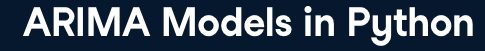

# I. ARMA MODELS
**Objective learn about stationarity and how this is important for ARMA models. Learn how to test for stationarity by eye and with a standard statistical test. Finally, learn the basic structure of ARMA models and use this to generate some ARMA data and fit an ARMA model.**

# 1. Intro to time series and stationarity


Time series data is everywhere in this world. There are many datasets for which we would like to be able to predict the future. 

ARIMA models are one of the go-to time series tools. You will learn how to fit these models and how to optimize them. You will learn how to make forecasts of important real-world data, and importantly how to find the limits of your forecasts.

**What is the difference between ARMA and ARIMA models?** Let’s start with what both mean. ARMA stands for “Autoregressive Moving Average” and ARIMA stands for “Autoregressive Integrated Moving Average.”

The only difference, then, is the “integrated” part. Integrated refers to the number of times needed to difference a series in order to achieve stationarity, which is required for ARMA models to be valid. By differencing, I mean forming a new series by subtracting observation 1 from 2, 2, from 3, etc.

So an ARMA model is equivalent to an ARIMA model of the same MA and AR orders with no differencing.

The typical short-hand notation for ARMA is “ARMA(p,q)” 
- where p is the AR order and 
- q is the MA order. 

For ARIMA, the notation is “ARIMA(p,d,q)” where the added d is the order of integration, or number of differences. So the following two statements sum it all up:

- ARMA(p,q) is equivalent to ARIMA(p,**0**,q)
- Given an ARIMA(p,d,q), if d>0 one can modle this as an ARMA by running an ARMA(p,q) after differencing the original series d times.

**Key Features of Time Series**

**Trend.** A positive trend is a line that generally slopes up - the values increase with time. Similarly, a negative trend is where the values decrease.

**Seasonality.** A seasonal time series has patterns that repeat at regular intervals, for example high sales every weekend.

**Cyclicality.** In contrast, cyclicality is where there is a repeating pattern but no fixed period.

**White Noise.** White noise is an important concept. White noise is a series of measurements, where each value is uncorrelated with previous values. You can think of this like flipping a coin, the outcome of a coin flip doesn't rely on the outcomes of coin flips that came before. Similarly, with white noise, the series value doesn't depend on the values that came before.

**Stationarity.** To model a time series, it must be stationary. Stationary means that the distribution of the data doesn't change with time. For a time series to be stationary it must fulfill three criteria. These are: 

- The series has zero trend, it isn't growing or shrinking
- The variance is constant. The average distance of the data points from the zero line isn't changing
- The autocorrelation is constant. How each value in the time series is related to its neighbors stays the same.

**Trend is zero**
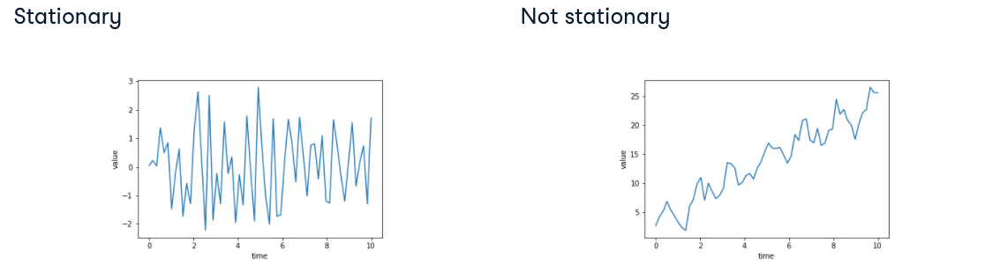

**Variance is constant**
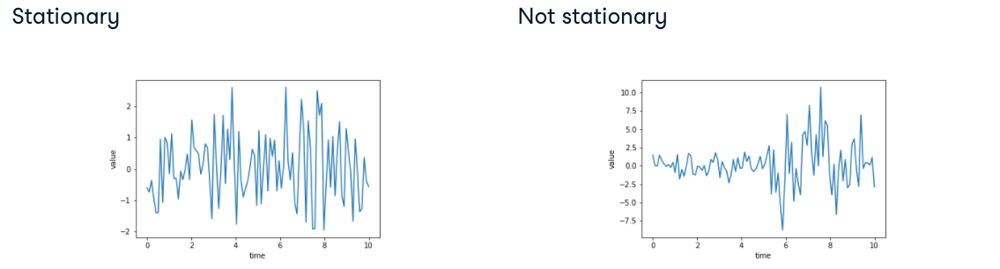

**Autocorrelation is constant**
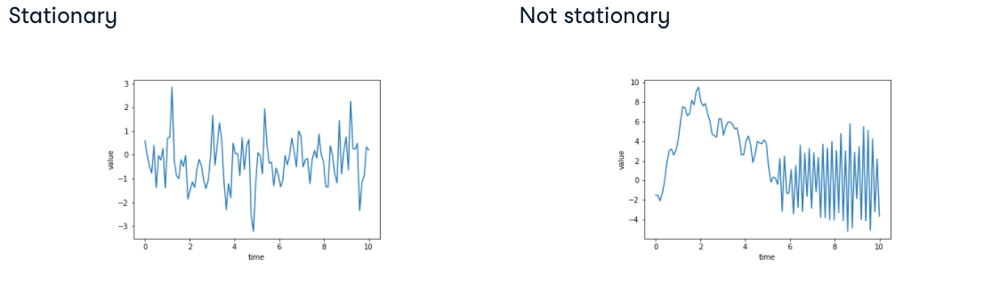

**Train Test Split**

In machine learning generally you have a training set which you fit your model on, and a test set which you test your predictions against. Time series forecasting is no different. **Our train-test split will be different however.** 

We use the past values to make future predictions, and so **we will need to split the data in time.** We train on the data earlier in the time series and test on the data that comes later. We can split time series at a given date as shown above using the DataFrame's dot-loc method.

# 2. Making Time Series Stationary

You just saw in the last section how we can see non-stationary data via a visual approach. We cannot rely on visual analysis. There are more formal ways of determining stationarity with statistical tests. There are also ways to transform non-stationary time series into stationary ones.

**The Augmented Dicky-Fuller Test** The most common test for identifying whether a time series is non-stationary is the augmented Dicky-Fuller test. This is a statistical test, where the null hypothesis is that your time series is non-stationary due to trend.
- tests for trend non-stationarity
- null hypothesis is time series is non-stationary

**Application of the adfuller test (python)** We can implement the augmented Dicky-Fuller test using statsmodels. First we import the adfuller function as shown, then we can run it on our time series.
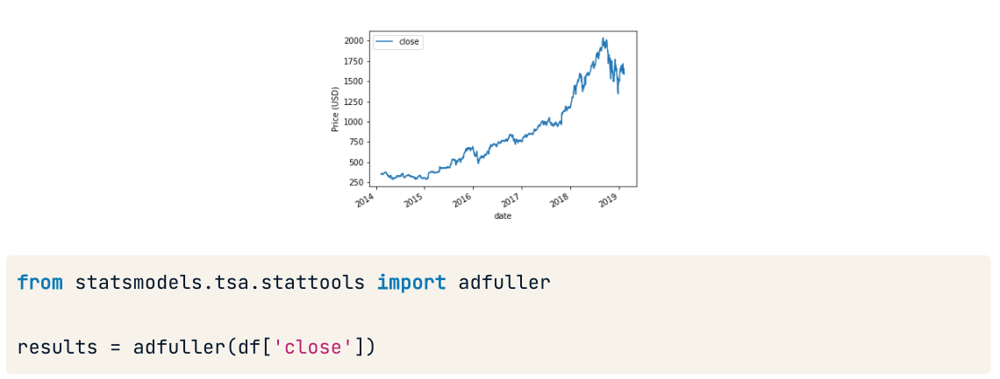

**Interpreting the adfuller test results** The results object is a tuple. 

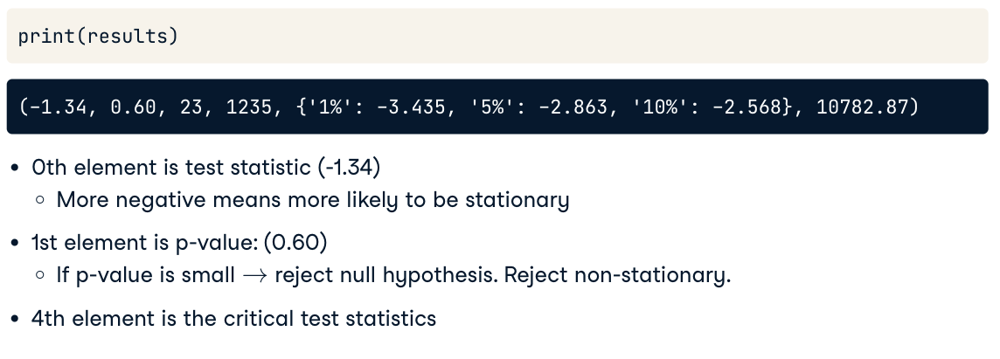

The zeroth element is the test statistic, in this case it is -1.34. The more negative this number is, the more likely that the data is stationary. The next item in the results tuple, is the test p-value. Here it's 0.6. If the p-value is smaller than 0.05, we reject the null hypothesis and assume our time series must be stationary. The last item in the tuple is a dictionary. This stores the critical values of the test statistic which equate to different p-values. In this case, if we wanted a p-value of 0.05 or below, our test statistic needed to be below -2.91.

We will ignore the rest of the tuple items for now but you can find out more about them here.
1 https://www.statsmodels.org/dev/generated/statsmodels.tsa.stattools.adfuller.html


**The value of plotting.** Statistical tests are useful but sometimes they don't capture the full picture. It is always worth plotting your time series as well as doing the statistical tests. The Dicky-Fuller only tests for trend stationarity. In this example, the time series behavior clearly changes, and is non-stationary however, it passes the Dicky-Fuller test.

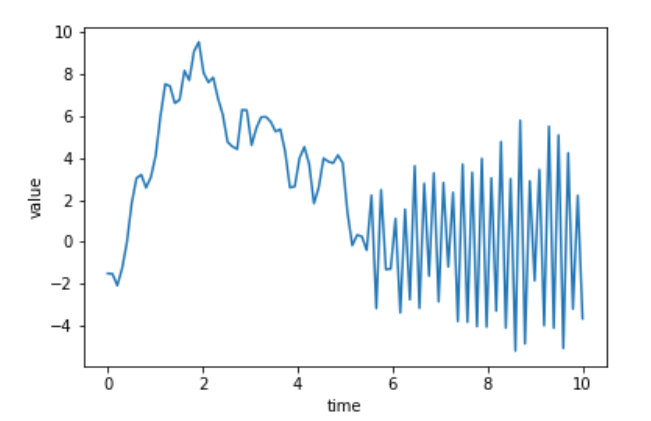

**Making a time series stationary** If we have a time series that is non-stationary we need to transform the data into a stationary form before we can model it. You can think of this a bit like feature engineering in classic machine learning.
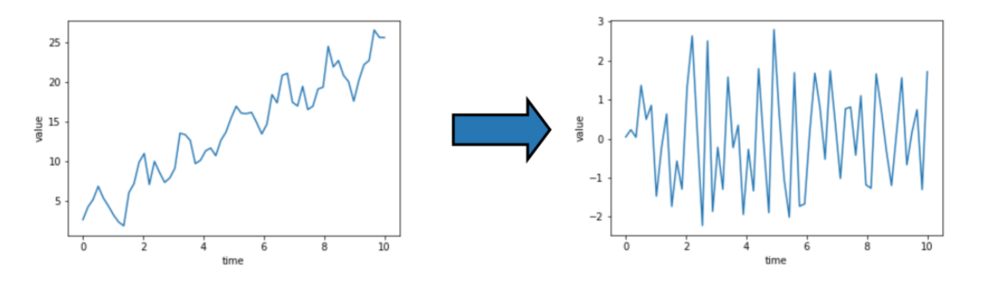

**Taking the difference.** Let's start with a non-stationary dataset. Here is an example of the population of a city.
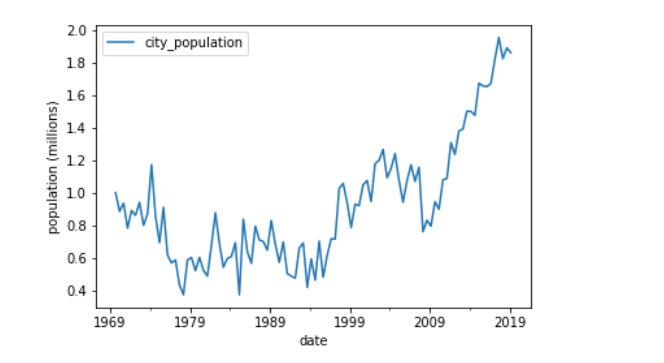

One very common way to make a time series stationary is to take its difference. This is where, from each value in our time series we subtract the previous value.
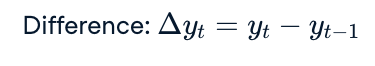

We can do this using the dot-diff method of a pandas DataFrame. Notice that this gives us one NaN value at the start since there is no previous value to subtract from it.
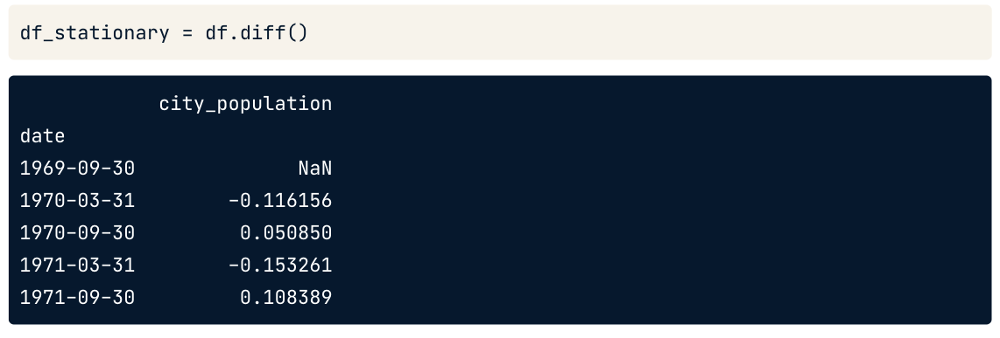

We can get rid of this using the dot-dropna method.
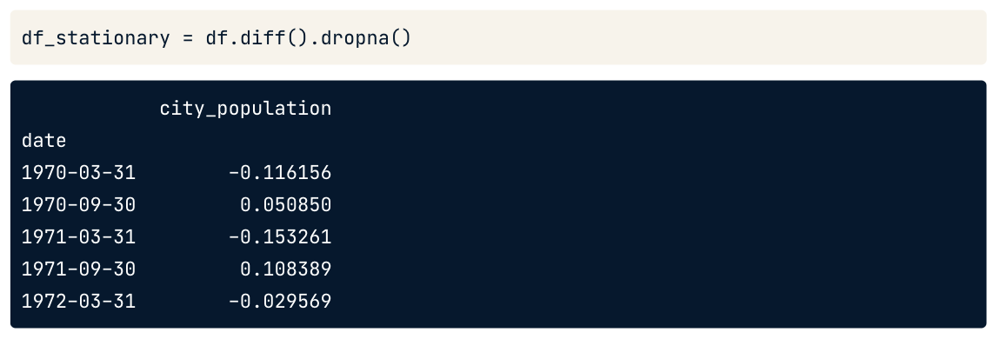

Here is the time series after differencing. This time, taking the difference was enough to make it stationary, but for other time series we may need to take the difference more than once.
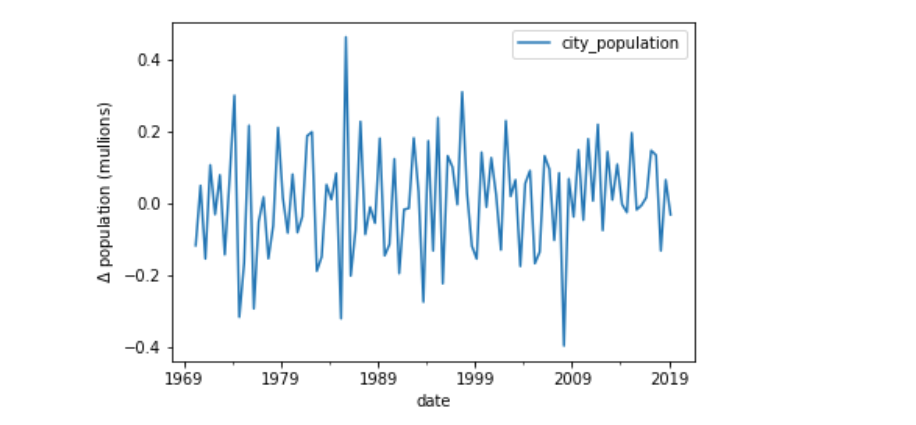

**Other Transforms** Sometimes we will need to perform other transformations to make the time series stationary. This could be to take the log, or the square root of a time series, or to calculate the proportional change. It can be hard to decide which of these to do, but often the simplest solution is the best one.
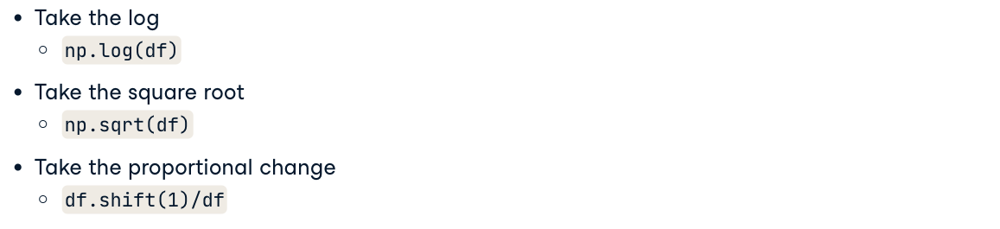

# 3. Intro to AR, MA, & ARMA models

We will discuss AR and MA models and how these are combined into ARMA models.

**AR Models** In an autoregressive model we regress the values of the time series against previous values of this same time series. The equation for a simple AR model is shown here: 
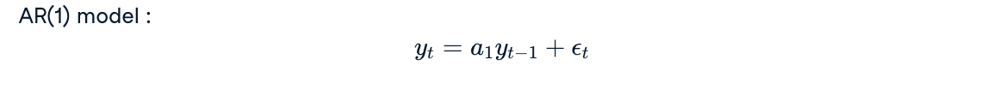

The value of the time series at time t, is 
- a<sub>1</sub> times the value of the time series at the previous step
    - a<sub>1</sub> is the autoregressive coefficient at lag one
- There's also a shock term, $\epsilon$<sub>t</sub> (epsilon)
    - The shock term is white noise, meaning each shock is random and not related to the other shocks in the series  

Compare this to a simple linear regression where the dependent variable is y<sub>t</sub> and the independent variable is y<sub>t-1</sub>. The coefficient a<sub>1</sub> is just the slope of the line and the shocks are the residuals to the line.
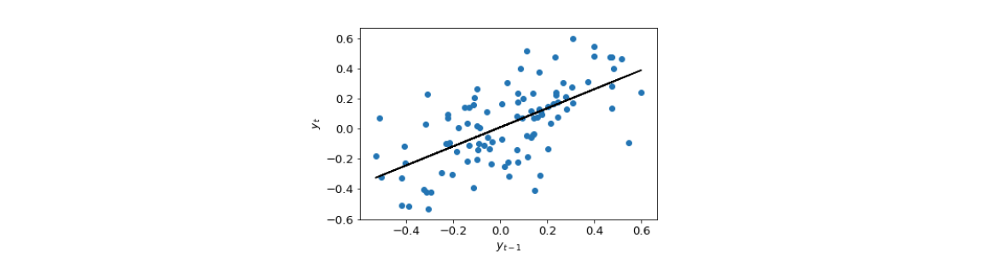

This is a first order AR model. The order of the model is the number of time lags used. An order two AR model has two autoregressive coefficients, and has two independent variables, the series at lag one and the series at lag two. More generally, we use p to mean the order of the AR model. This means we have p autoregressive coefficients and use p lags.
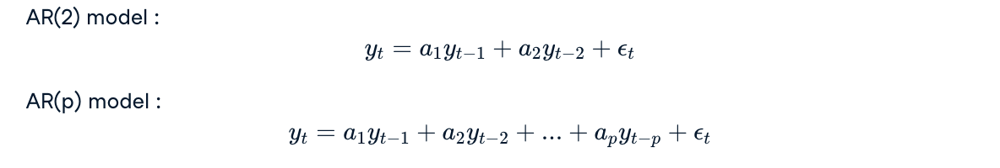

**MA models**
In a moving average model we regress the values of the time series against the previous shock values of this same time series. The equation for a simple MA model is shown here. The value of the time series, is m<sub>1</sub> times the value of the shock at the previous step; plus a shock term for the current time step. This is a first order MA model. Again, the order of the model means how many time lags we use. An MA two model would include shocks from one and two steps ago. More generally, we use q to mean the order of the MA model.
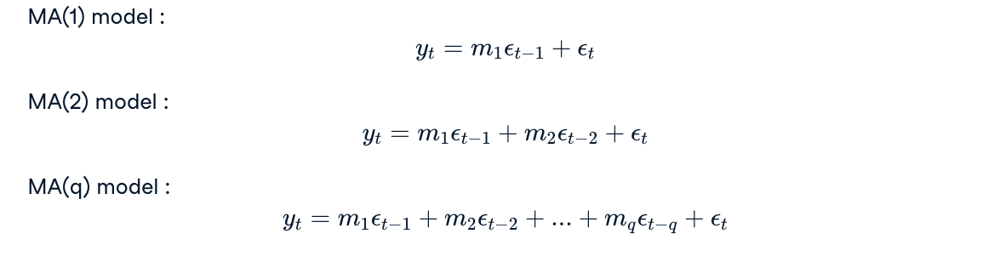

**ARMA models**
An ARMA model is a combination of the AR and MA models. The time series is regressed on the previous values and the previous shock terms. This is an ARMA-one-one model. More generally we use ARMA-p-q to define an ARMA model. The p tells us the order of the autoregressive part of the model and the q tells us the order of the moving-average part.
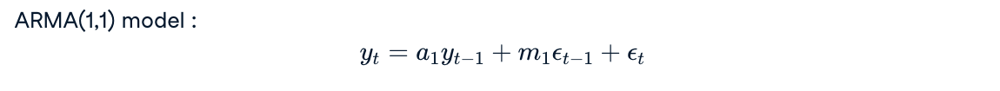

**Creating ARMA data**
Using the statsmodels package, we can both fit ARMA models and create ARMA data. Lets take this ARMA(1,1) model. Say we want to simulate data with these coefficients.

First we import the arma-generate-sample function. Then we make lists for the AR and MA coefficients. Note that both coefficient lists start with one. This is for the zero lag term and we will always set this to one. We set the lag one AR coefficient as 0.5 and MA coefficient as 0.2. We generate the data, passing in the coefficients, the number of data points to create, and the standard deviation of the shocks. Here, we actually pass in the negative of the AR coefficients we desire. This is a quirk we will need to remember.
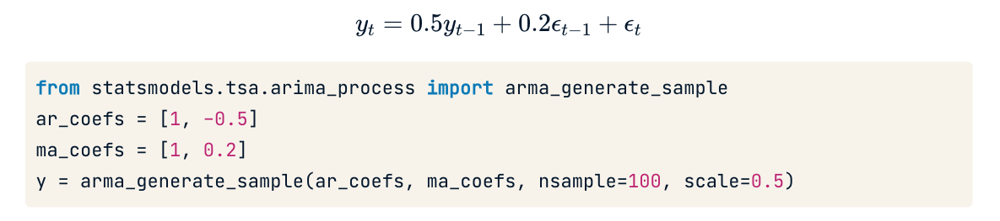

Our sample may look like this:
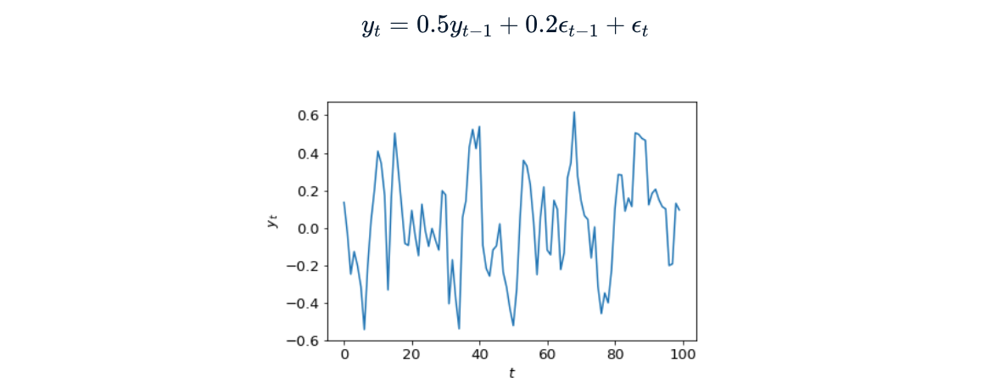


# II. FITTING THE FUTURE
**Predict what lies ahead in your data. Learn to use the elegant statsmodels package to fit ARMA, ARIMA and ARMAX models.**

**Fitting and ARMA model**
Here is a quick peek at how we might fit this data. First we import the ARMA model class. We instantiate the model, feed it the data and define the model order. Then finally we fit.
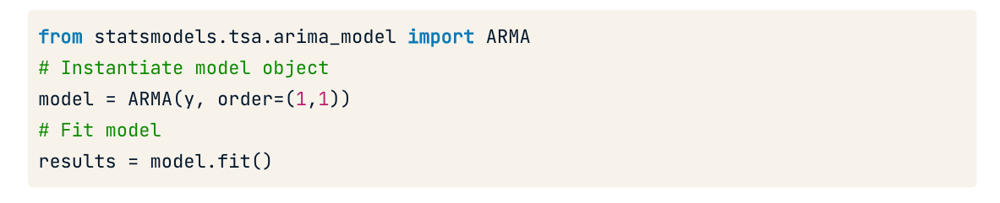

# 1. Fitting time series models

In this section you will get hands on with fitting these models to real world data and making forecasts.

**Creating a model** To fit these models we first import the ARMA model class from the statsmodels package. We create a model object and define the model order, we must also feed in the training data. The data can be a pandas dataframe, a pandas series or a numpy array. 

The order for an ARMA model is defined by p & q:
- p, the number of autoregressive lags
- q, the number of moving average lags
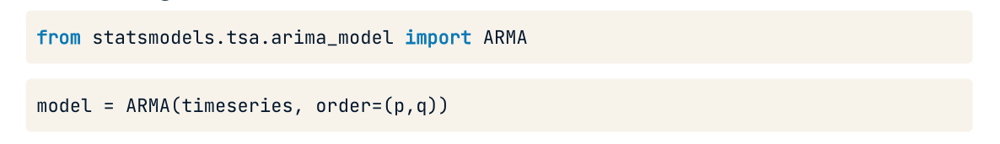

**Creating AR and MA models**

To fit an AR model we can simply use the ARMA class with q equal to zero. To fit an MA model, we set p equal to zero
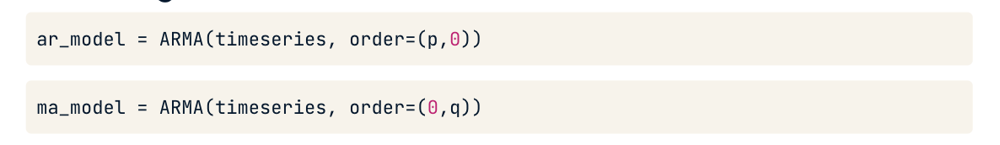

**Fitting the model and fit summary**

To fit the model we use the model's dot-fit method. This returns an ARMA results object. We can print the summary of the model fit using the results' dot-summary method.
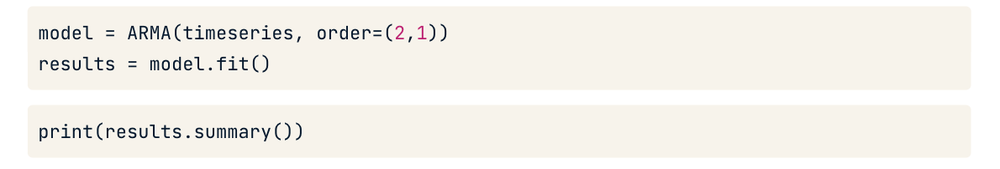

**Fit summary.** The printed summary will look like this. Let's take a closer look at the top of this table.
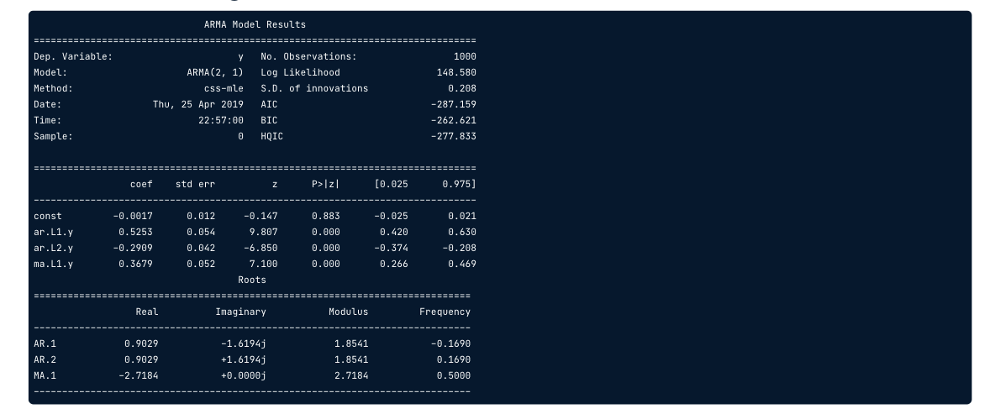

The top section includes useful information such as the order of the model that we fit, the number of observations or data points and the name of the time series. The S.D. of innovations is the standard deviation of the shock terms.
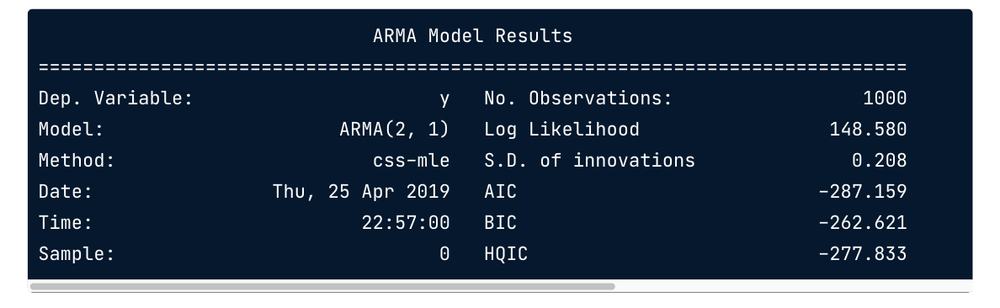

The next section of the summary shows the fitted model parameters. Here we fitted an ARMA(2,1) model, so the model has AR-lag-1 and lag-2 coefficients. In the table these are the AR.L1.y and AR.L2.y rows. The lag-1 MA coefficient is in the last row. The first column shows the model coefficients whilst the second column shows the standard error in these coefficients. This is the uncertainty on the fitted coefficient values.
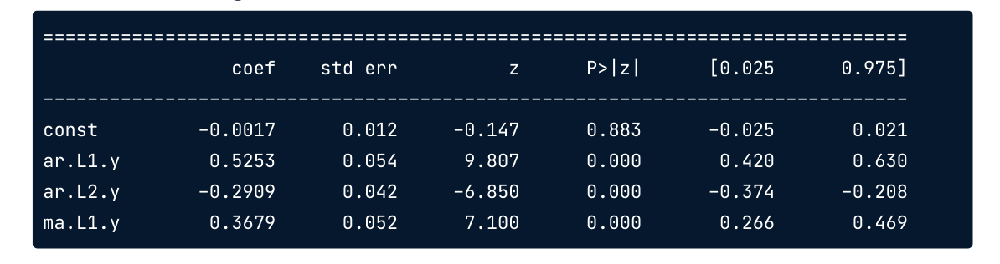

**Introduction to ARMAX models**

One possible extension to the ARMA model is to use exogenous inputs to create the ARMAX model. This means that we model the time series using other independent variables as well as the time series itself. This is like a combination between an ARMA model and a normal linear regression model.

**ARMAX equation** The equations for two simple ARMA and ARMAX models are shown here. The only difference is one extra term. We add a new independent variable z<sub>t</sub> multiplied by its coefficient x<sub>one</sub>.
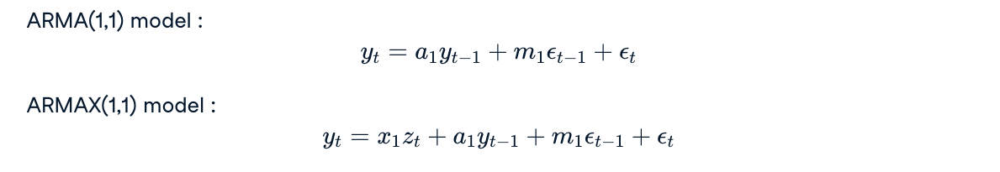

**ARMAX example** Imagine you wanted to model your own daily personal productivity. This could reasonably be an ARMA model as your productivity on previous days may have an effect your productivity today. You could be over worked or just on a roll. A useful exogenous variable could be the amount of sleep you got the night before since this might affect your productivity. Here z<sub>1</sub> would be hours slept, and if more sleep made you more productive then the coefficient x<sub>1</sub> would be positive.
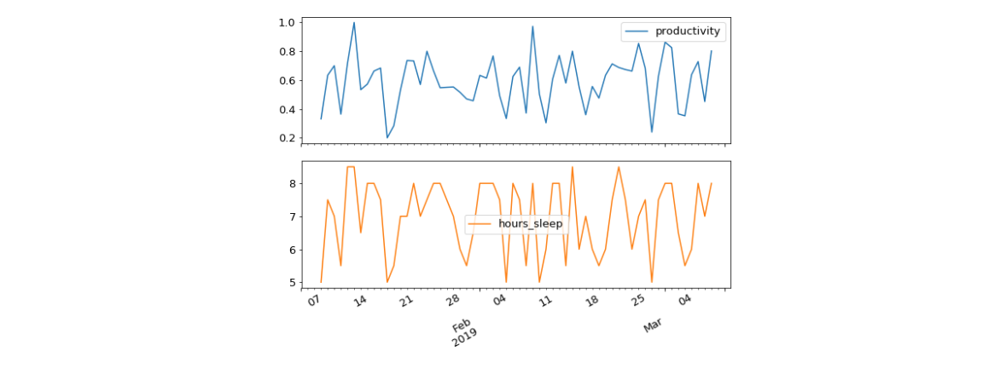

**Fitting ARMAX** We can fit an ARMAX model using the same ARMA model class we used before. The only difference is that we will now feed in our exogenous variable using the exog keyword. The model order and the fitting procedure are the same.
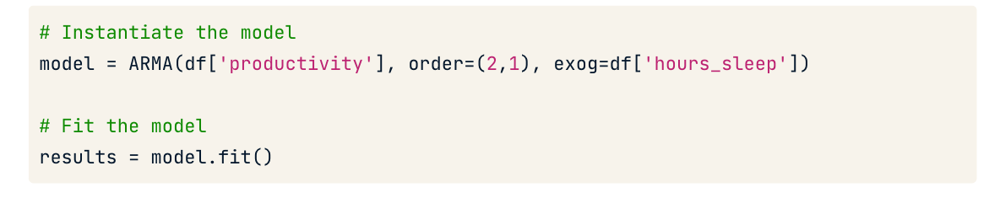

The summary now includes information in the x-one row for the exogenous variable parameter.
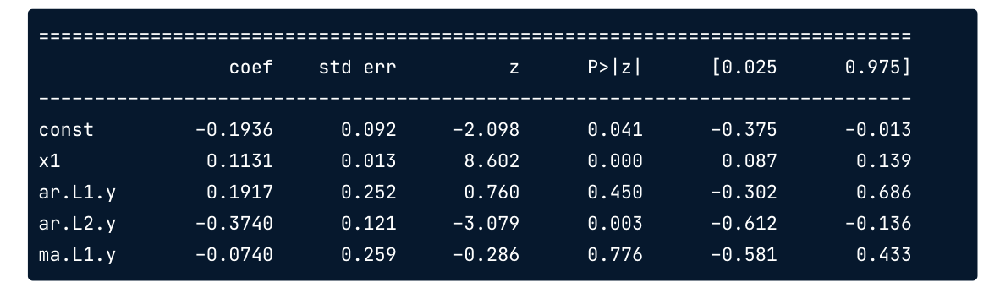

# 2. Forecasting

Now that we know how to fit models, let's use them to predict the future.

**One-step-ahead predictions: Predicting the next value** Take a simple AR(1) model. At any point in the time series we can estimate the next series value. We make this prediction by multiplying the previous value by the lag-one AR coefficient. If the previous value was 10 and coefficient a<sub>1</sub> is 0.6, we would estimate the next value as 6. If the shock term had a standard deviation of 1, we would predict our lower and upper uncertainty limits to be 5 and 7.
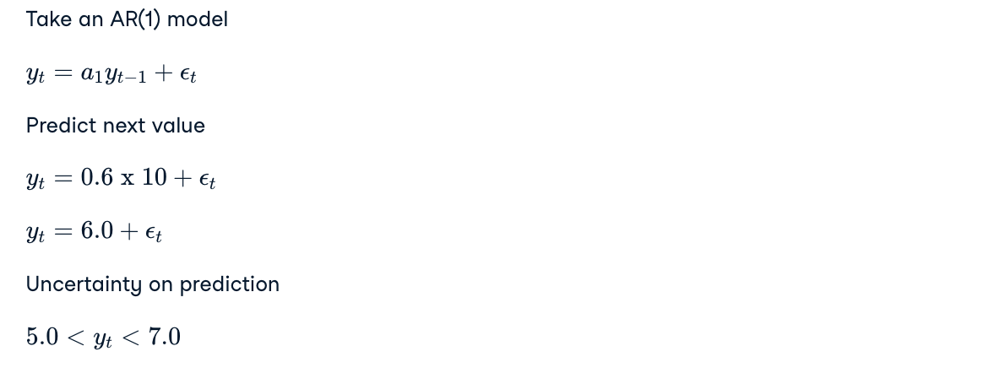

In the time period we have data for, we can make lots of these predictions in-sample; using the previous series value to estimate the next ones. This is called a one-step-ahead prediction. This allows us to evaluate how good our model is at predicting just one value ahead. Here, the mean prediction is marked with a red line while the uncertainty range is shaded. The uncertainty is due to the random shock terms that we can't predict.
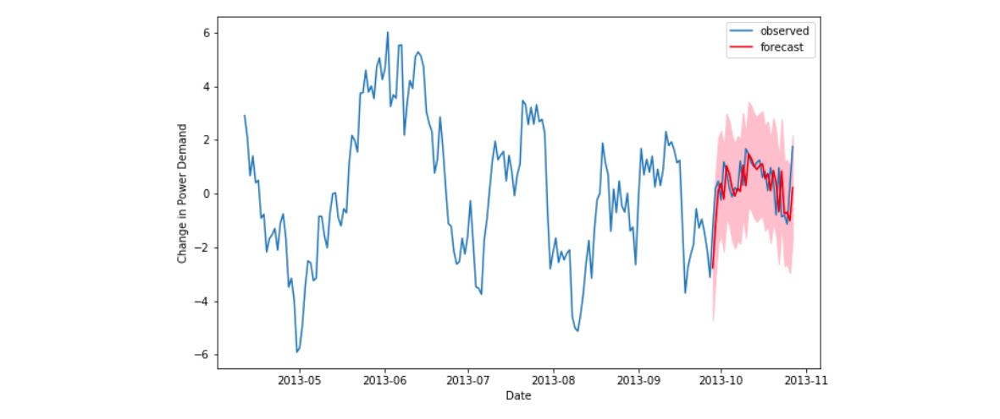

**Statsmodels SARIMAX class**

A SARIMAX model with order p-zero-q is exactly the same as an ARMA-p-q model. This model class can do everything that the ARMA model class can do and can be extended even further.
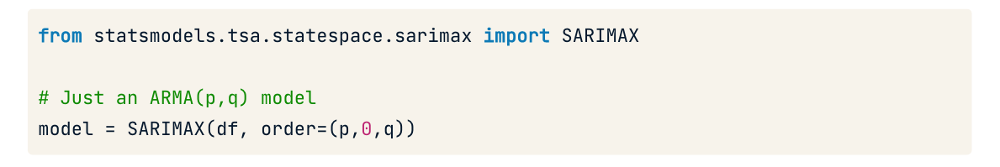

This class has an additional model order. We can also add a constant to the model using trend equals c. If the time series isn't centered around zero this is a must.
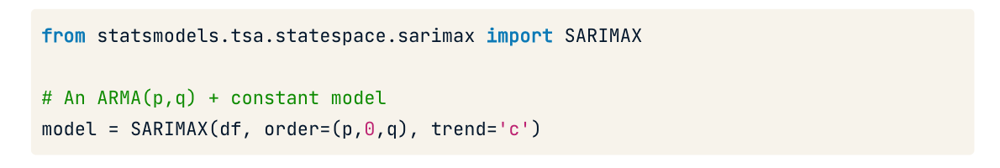

**Making one-step-ahead predictions** Starting from a SARIMAX fitted results object, we can use its get_prediction method to generate in sample predictions. We set the start parameter as a negative integer stating how many steps back to begin the forecast. Setting start to -25 means we make predictions for the last 25 entries of the training data.
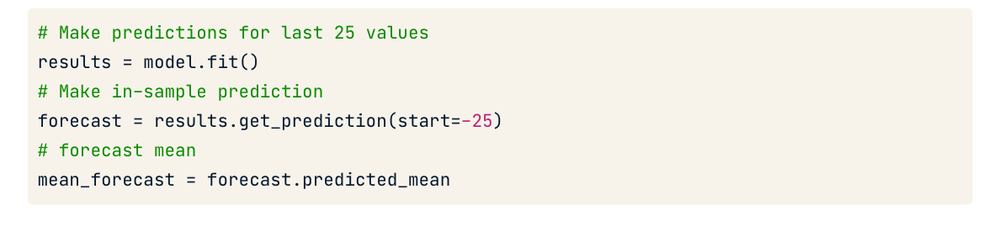

This returns a forecast object. The central value of the forecast is stored in the predicted_mean attribute of the forecast object. This predicted mean is a pandas series.
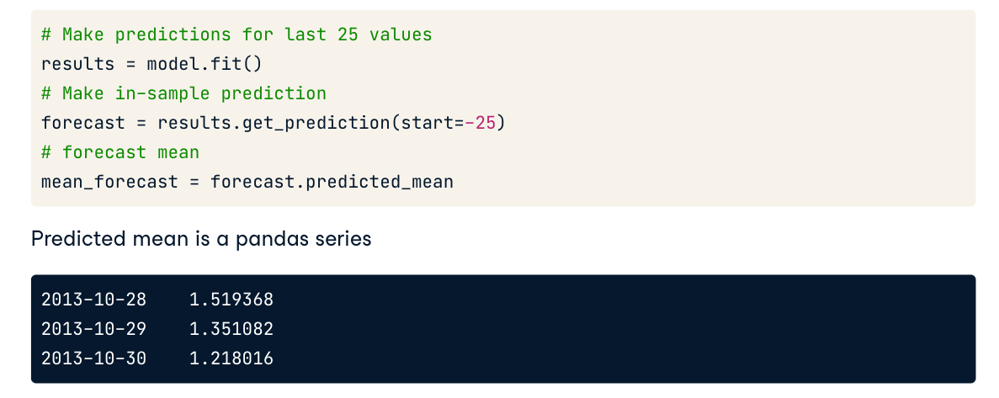

**Confidence intervals** To get the lower and upper limits on the values of our predictions we use the conf_int method of the forecast object. This generates a pandas DataFrame of the lower and upper uncertainty range of our prediction.
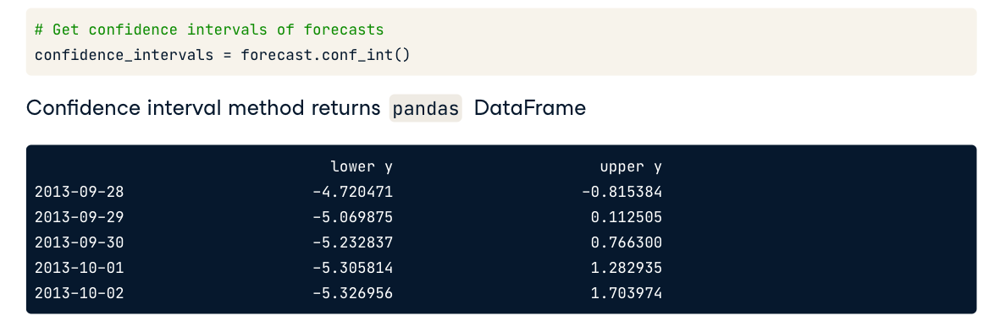

**Plotting predictions** We can use pyplot's dot-plot method to plot the mean value. We use pyplot.fill_between to shade the area between our lower and upper limits.
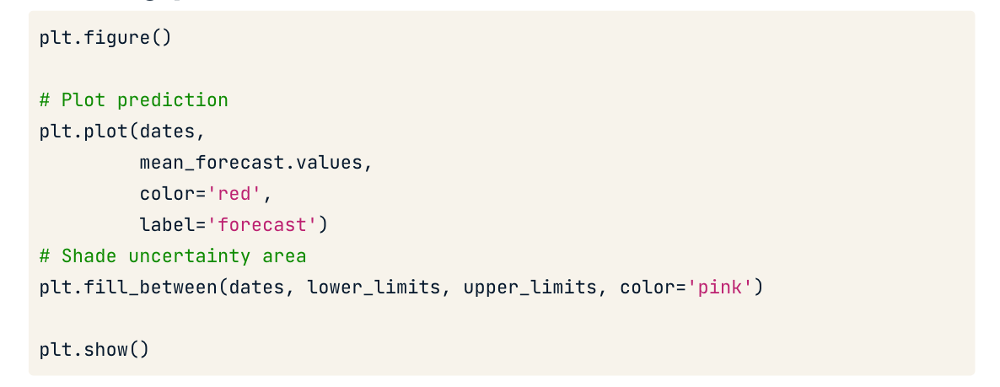

**Dynamic predictions**

We can make predictions further than just one step ahead. To make these dynamic predictions we predict one step ahead, and use this predicted value to forecast the next value after that ... and so on. Since we don't know the shock term at each step, our uncertainty can grow very quickly.
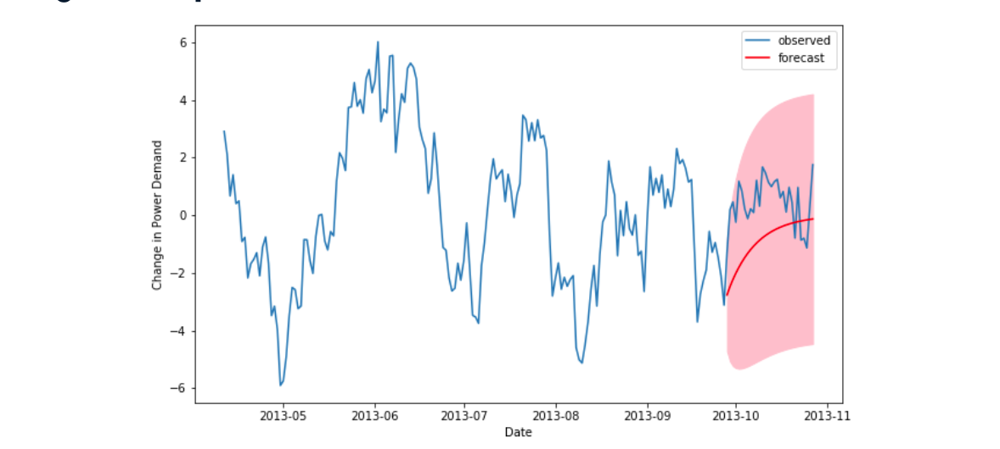

Making dynamic predictions is very similar to making one-step-ahead predictions. The only difference is that in the get-predictions method, we set the parameter dynamic equals true. Everything else is exactly as before.
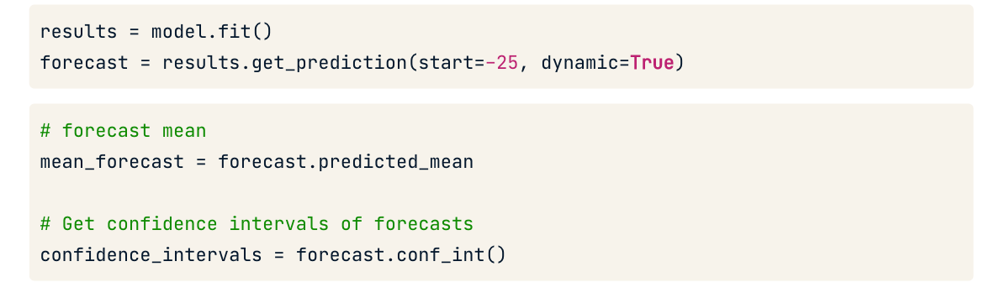

**Forecasting out of sample** After testing our predictions in-sample, we can use our model to predict the future. To make future forecasts we use the get_forecast method of the results object. We choose the number of steps after the end of the training data to forecast up to. Everything else neatly follows as before.
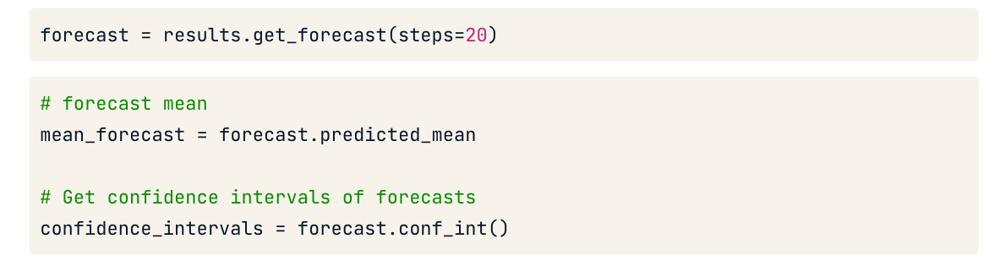

This is also a dynamic forecast.
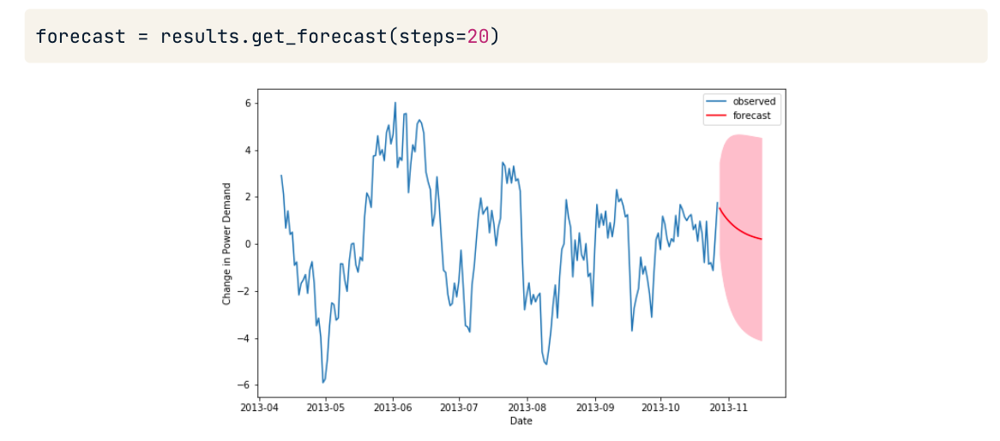

# 3. The ARIMA Model

Now let's tie together forecasting and non-stationarity and show how we can overcome some problems that happen when these things meet.

**Non-stationary time series recap** Lets look again at a non-stationary time series. This is the growth rate of world population. You learned in chapter one that you cannot apply an ARMA model to non-stationary time series such as this. We need to take the difference of the time series to make it stationary. Only then can we model it.
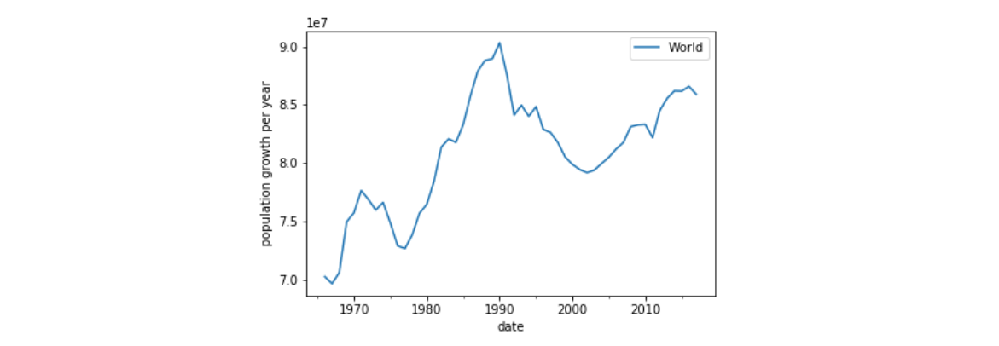

Here we have taken the first difference of the time series. This is now stationary and we can model it with an ARMA model.
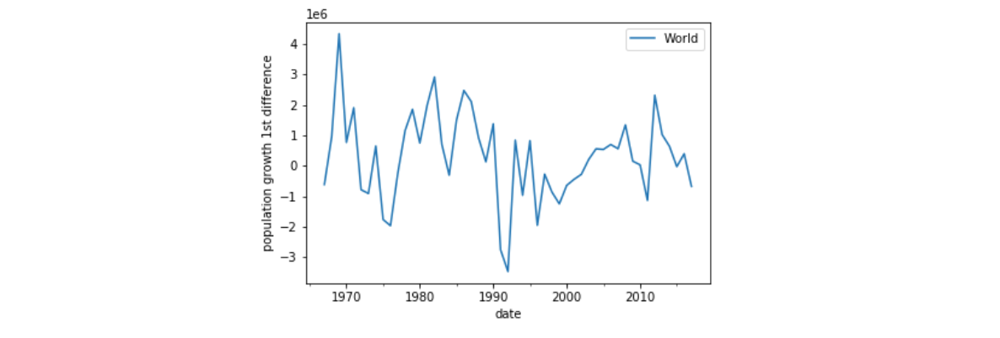

**Forecast of differenced time series** However, when we do this, we will have a model which is trained to predict the value of the difference of the time series. **What we really want to predict is the not the difference, but the actual value of the time series.** We can achieve this by carefully transforming our prediction of the differences.
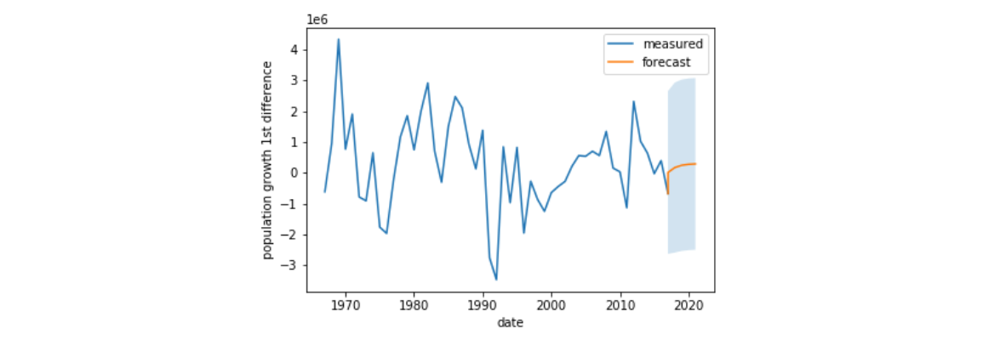

**Reconstructing original time series after differencing** We start with predictions of the difference values The opposite of taking the difference is **taking the cumulative sum or integral (cumsum)**. We will need to use this transform to go from predictions of the difference values to predictions of the absolute values. We can do this using the numpy.cumsum function. If we apply this function we now have a prediction of how much the time series changed from its initial value over the forecast period.
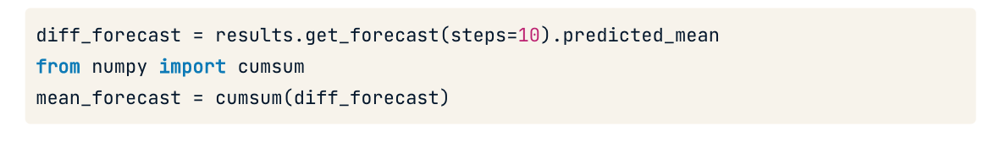

To get an absolute value we need to add the last value of the original time series to this.
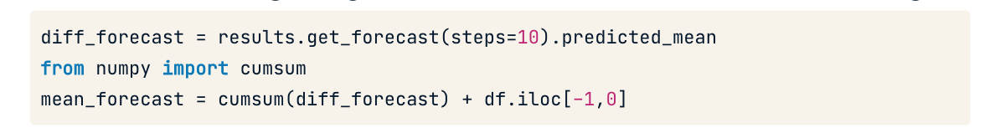

We now have a forecast of the non-stationary time series. If we would like to plot our uncertainties as before we will need to carefully transform them as well.
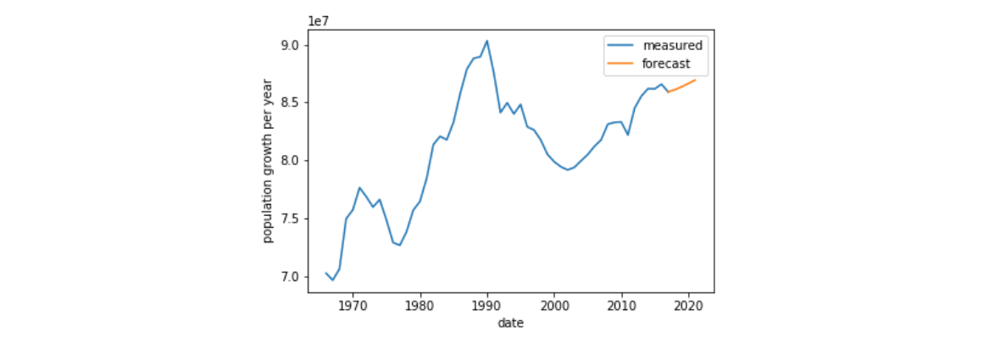

**The ARIMA model**
These steps of starting with non-stationary data; differencing to make it stationary; and then integrating the forecast are very common in time series modeling. This is a lot of work! But thankfully, there is a extension of the ARMA model which does it for us! This is the ARIMA, or autoregressive integrated moving average model.
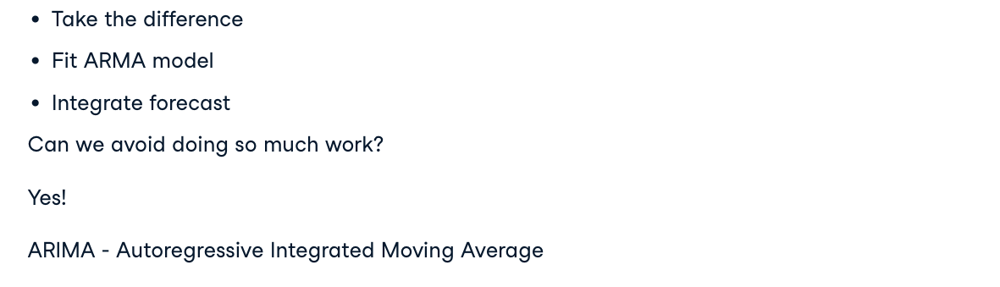

**Using the ARIMA model** We can implement an ARIMA model using the SARIMAX model class from statsmodels. The ARIMA model has three model orders. These are p the autoregressive order; d the order of differencing; and q the moving average order. In the previous lesson we were setting the middle order parameter d to zero. If d is zero we simply have an ARMA model.
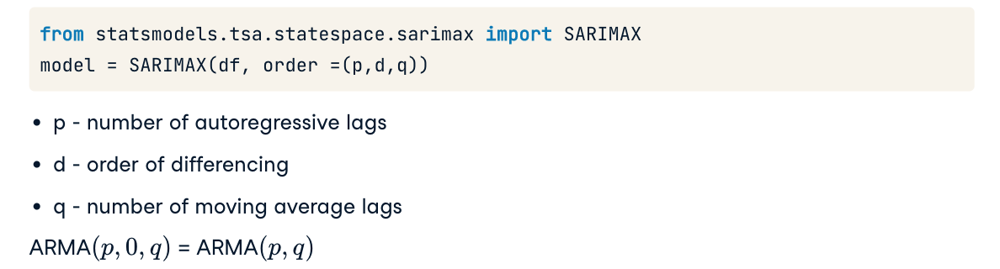

When we use this model, **we pass it in a non-differenced time series and the model order**. Here we want to difference the time series data just once and then apply an ARMA(2,1) model. This is achieved by using an ARIMA(2,1,1) model. After we have stated the difference parameter we don't need to worry about differencing any more. We fit the model as before and make forecasts. The differencing and integration steps are all taken care of by the model object.
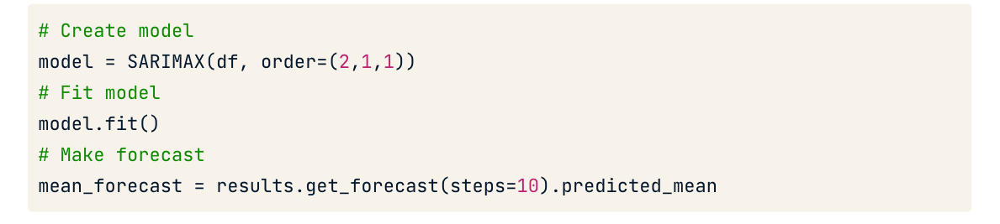

This is a much easier way to get a forecast for non-stationary time series!
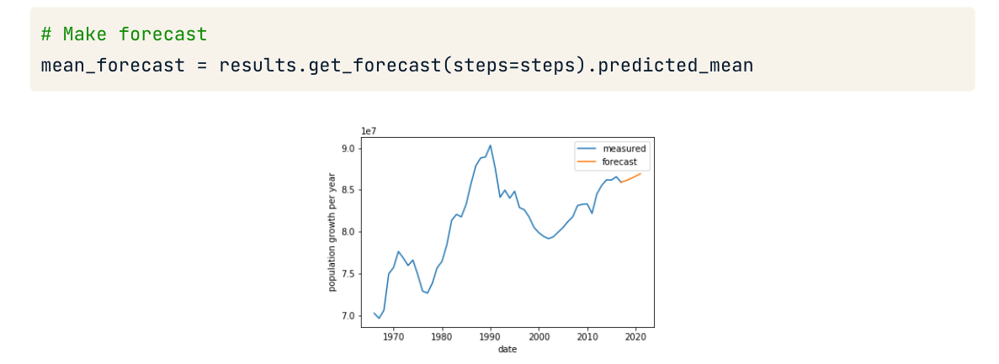

**Picking the difference order** We must still be careful about selecting the right amount of differencing. Remember, we difference our data only until it is stationary and no more. We will work this out before we apply our model, using the augmented Dicky-Fuller test to decide the difference order.
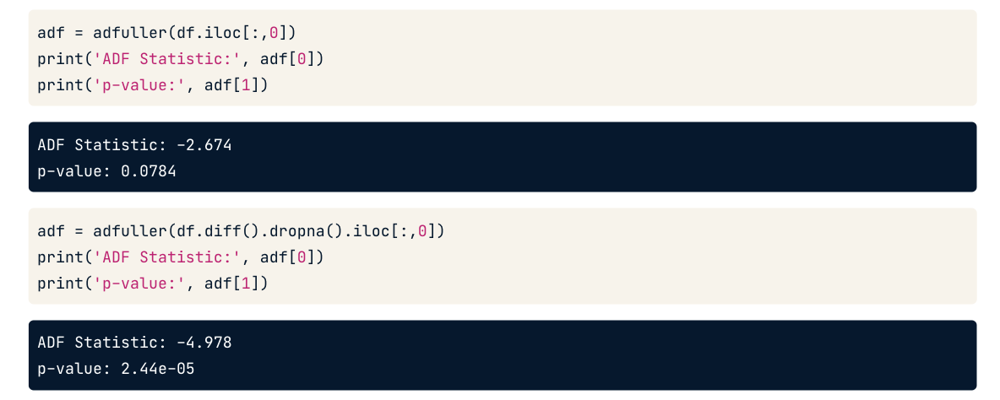

By the time we come to apply a model we already know the degree of differencing we should apply.
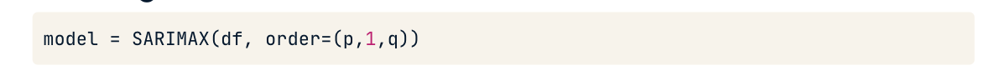

# III. THE BEST OF THE BEST MODELS
**Become a modeler of discerning taste. Identify promising model orders from the data itself, then, once the most promising models have been trained, choose the best model from this fitted selection. Utilize this great framework for structuring your time series projects.**

# 1. Intro to ACF and PACF

Now you know how to fit ARIMA models and make forecasts . . .

**but how do we choose which ARIMA model to fit?**

The model order is important to the quality of forecasts. Below are two different models fit to the same dataset creating two different forcasts. The mean predictions of the forecasts are shown as orange lines and you can see that they are very different.
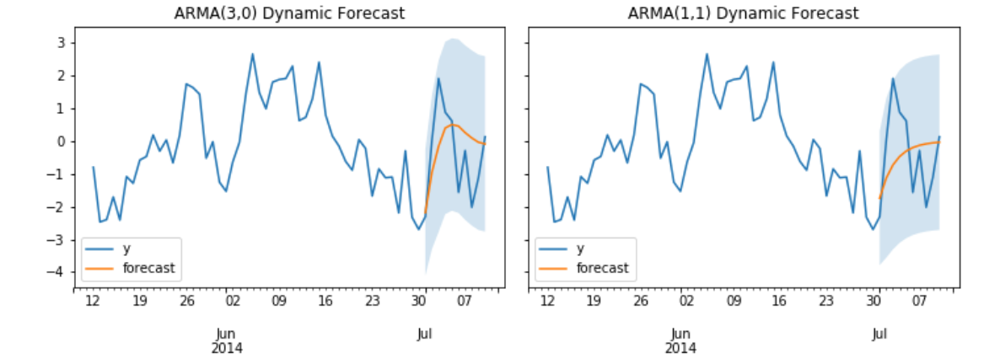

**ACF and PACF**
One of the main ways to identify the correct model order is by using the autocorrelation function, the ACF, and the partial autocorrelation function the PACF.

**What is the ACF?** The autocorrelation function at lag-1 is the correlation between a time series and the same time series offset by one step. The autocorrelation at lag-2 is the correlation between a time series and itself offset by two steps. And so on. When we talk about the autocorrelation function we mean the set of correlation values for different lags
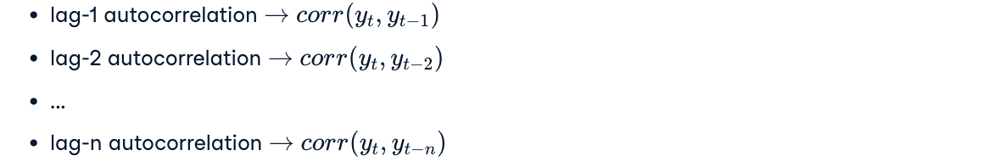

We can plot the autocorrelation function to get an overview of the data. The bars show and ACF values at increasing lags. If these values are small and lie inside the blue shaded region, then they are not statistically significant.
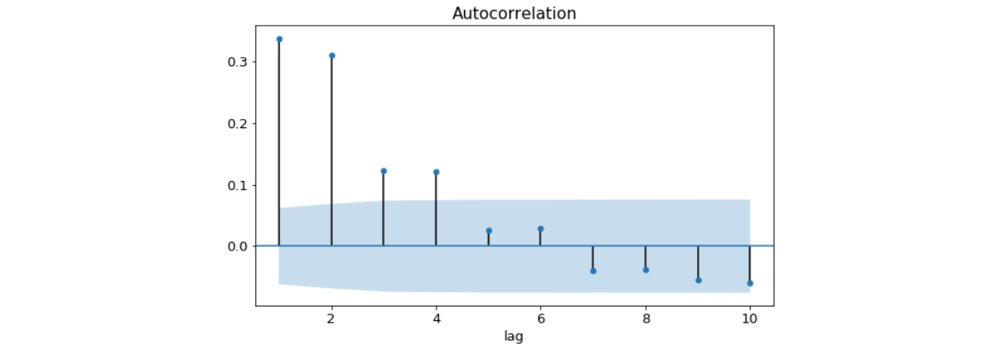

**What is the PACF?** The partial autocorrelation is the correlation between a time series and the lagged version of itself after we subtract the effect of correlation at smaller lags. So it is the correlation associated with just that particular lag. The partial autocorrelation function is this series of values and we can plot it to get another view of the data.
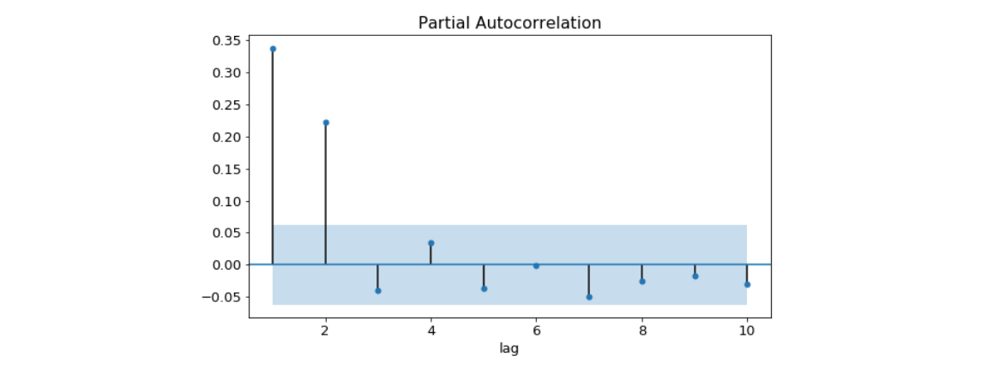

**Using ACF and PACF to choose model order**


By comparing the ACF and PACF for a time series we can deduce the model order. If the amplitude of the ACF tails off with increasing lag and the PACF cuts off after some lag p, then we have a AR(p) model. 

This plot is an AR(2) model
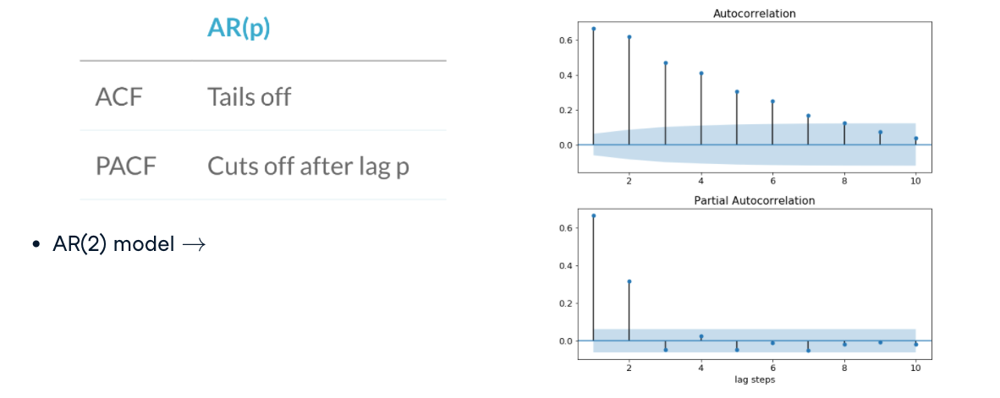

If the amplitude of the ACF cuts off after some lag q and the amplitude of the PACF tails off then we have a MA(q) model. This is an MA(2) model
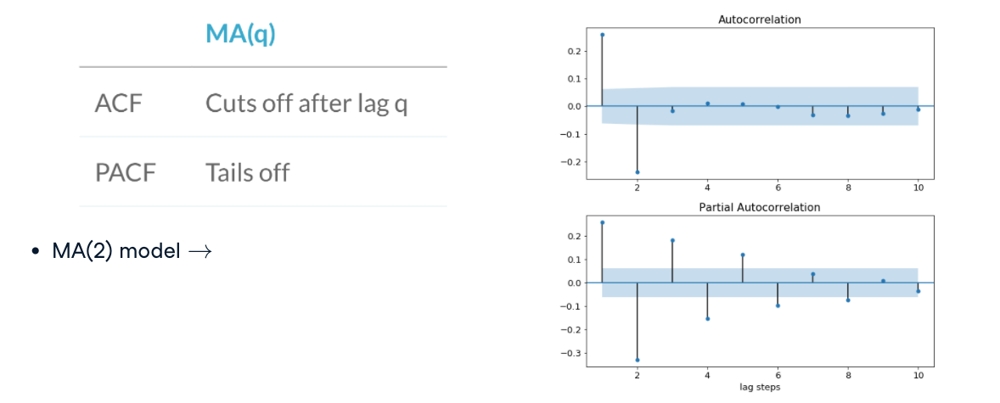

If both the ACF and PACF tail off then we have an ARMA model.
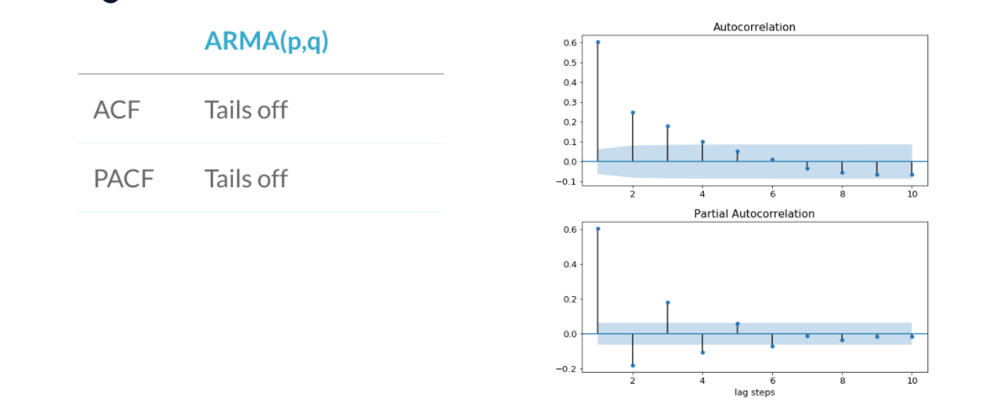

In this case we can't deduce the model orders of p and q from the plot.

You can refer to the following table when analyzing the ACF and PACF
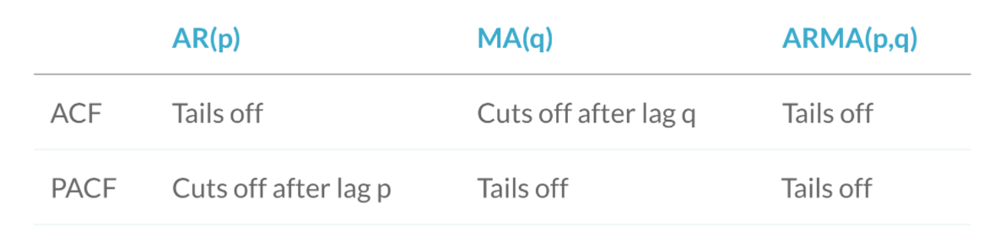

**Implementation in Python**

In the statsmodel package there are two functions to make plots of the ACF and the PACF. These are plot_acf and plot_pacf functions. 

To use them, we start by creating a figure with two subplots. Into each function we pass the time series DataFrame and the maximum number of lags we would like to see. We also tell it whether to show the autocorrelation at lag-0. The ACF and PACF at lag-0 will always have a value of one so we'll set this argument to false to simplify the plot. Finally we pass it the axis to plot on. The plot-pacf function works in the same way.
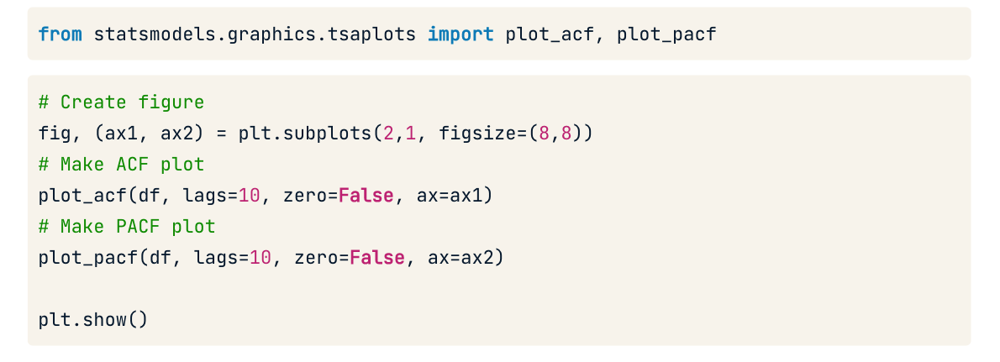

Here are the plots we generated.
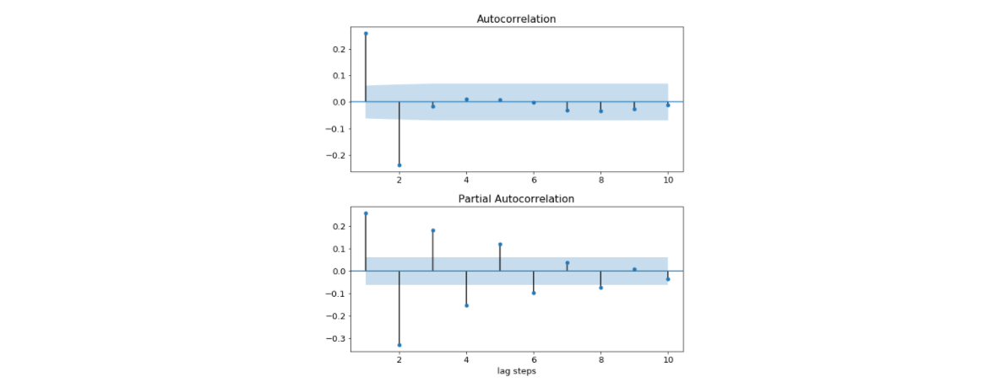

**Over/under differencing and ACF and PACF** The time series must be made stationary before making these plots. If the ACF values are high and tail off very very slowly this is a sign that the data is non-stationarity, so it needs to be differenced.
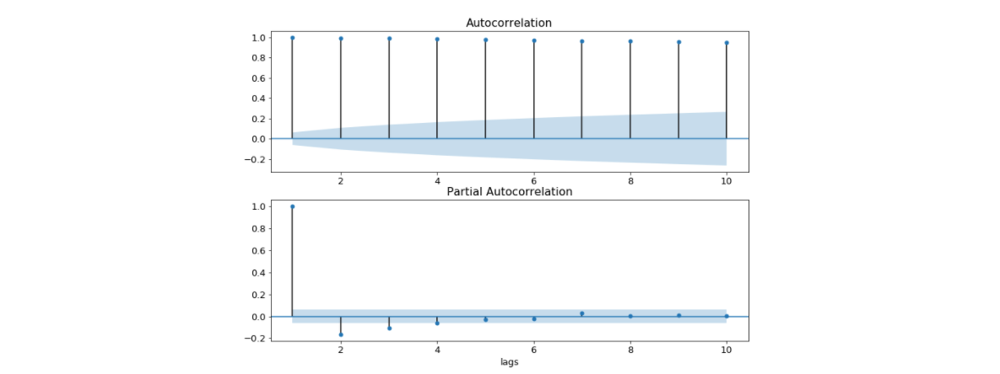

If the autocorrelation at lag-1 is very negative this is a sign that we have taken the difference too many times.
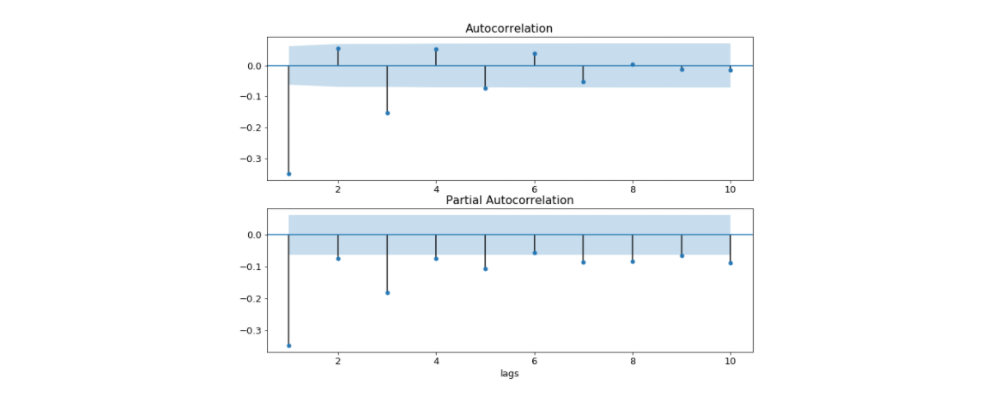

# 2. Intro to AIC and BIC

The ACF and PACF can't be used to choose the order of a model when both of the orders p and q are non-zero. However there are more tools we can use, the AIC and the BIC.

**AIC - Akaike information criterion**


The Akaike information criterion, or AIC, is a metric which tells us how good a model is. A model which makes **better predictions is given a lower AIC score**. The AIC also penalizes models which have lots of parameters. This means if we set the order too high compared to the data, we will get a high AIC value. This stops us overfitting to the training data.

**BIC - Bayesian information criterion**


The Bayesian information criterion, or BIC, is very similar to the AIC. Models which **fit the data better have lower BICs** and the BIC penalizes overly complex models.

**AIC vs BIC** For both of these metrics **a lower value suggests a better model**. The difference between these two metrics is how much they penalize model complexity. The BIC penalizes additional model orders more than AIC and so the BIC will sometimes suggest a simpler model. The AIC and BIC will often choose the same model, but when they don't we will have to make a choice. If our goal is to identify good predictive models, we should use AIC. However if our goal is to identify a good explanatory model, we should use BIC.
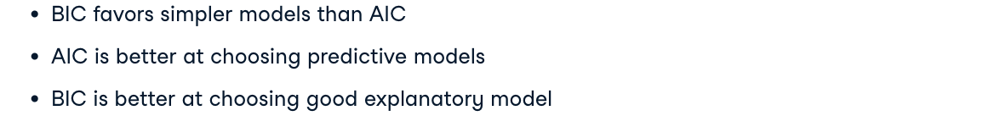

**AIC and BIC in statsmodels**


After fitting a model in Python, we can find th AIC and BIC by using the summary of the fitted-models-results object. These are on the right of the table.
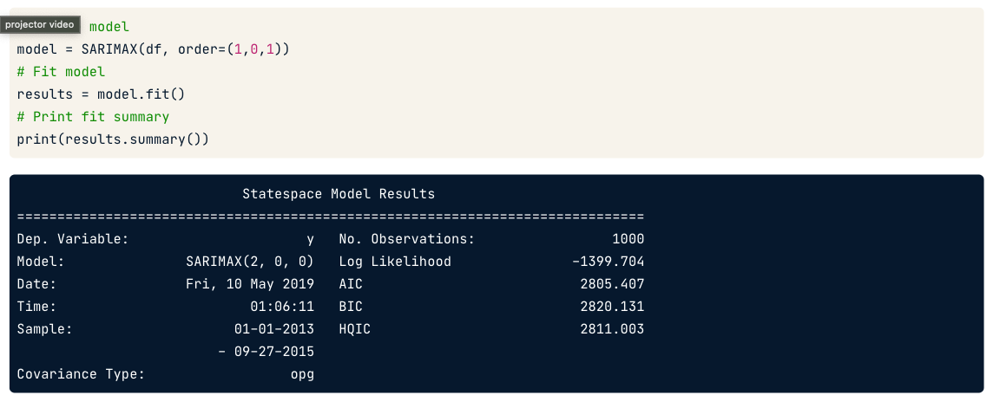

You can also access the AIC and BIC directly by using the .aic attribute and the .bic attribute of the fitted-model-results object.
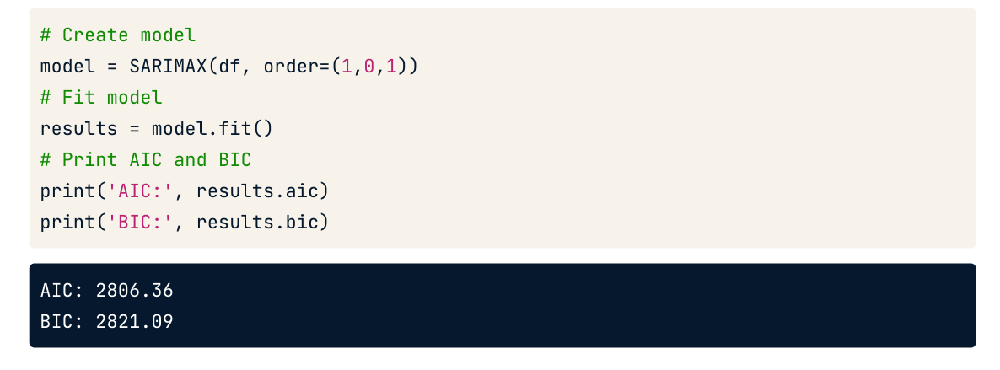

**Searching over AIC and BIC**


Being able to access the AIC and BIC directly means we can write loops to fit multiple ARIMA models to a dataset, to find the best model order. Here we loop over AR and MA orders between zero and two, and fit each model. Then we print the model order along with the AIC and BIC scores
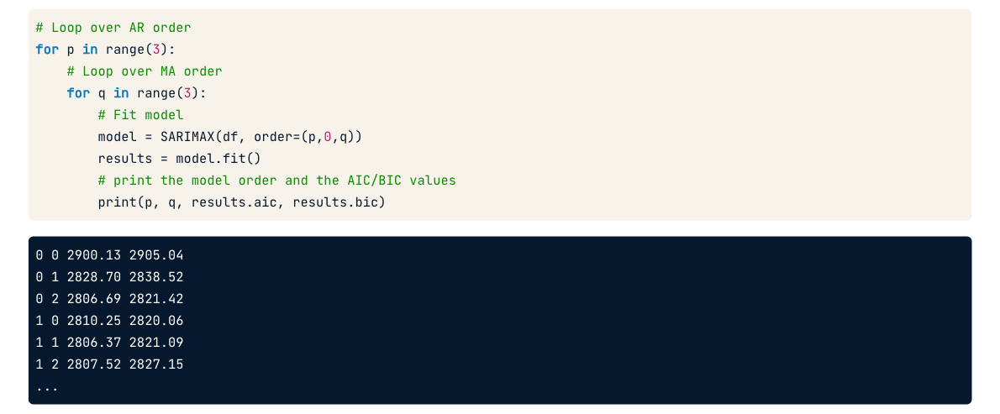

If we want to test a large number of model orders, we can append the model order and the AIC and BIC to a list, and later covert it to a DataFrame.
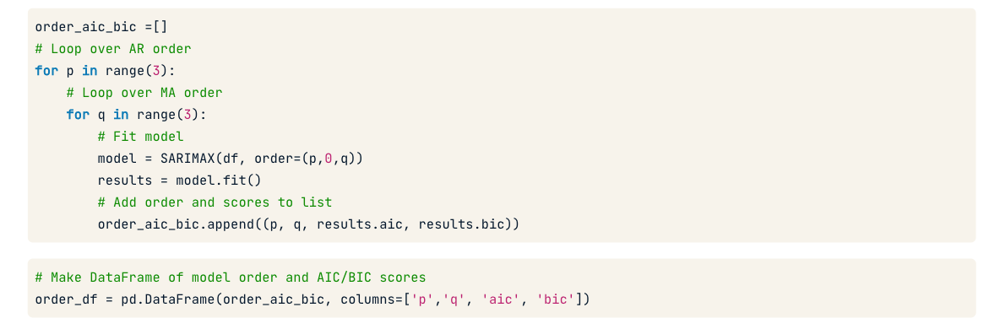

This means we can sort by the AIC score and not have to search through the orders by eye. We can do the same with the BIC score. In this case the AIC and BIC favor different models, but we want a good predictive model so we will choose the model with the lowest AIC. This is an ARMA(2,1) model.
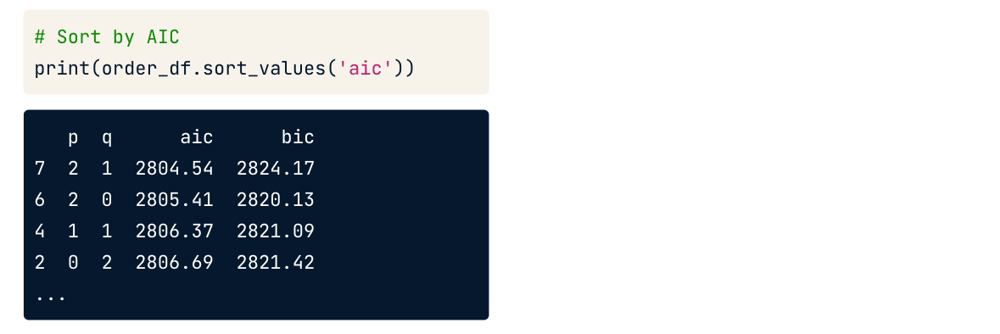

**Non-stationary model orders** Sometimes when searching over model orders you will attempt to fit an order that leads to an error. This ValueError tells us that we have tried to fit a model which would result in a non-stationary set of AR coefficients. This is just a bad model for this data, and when we loop over p and q we would like to skip this one.
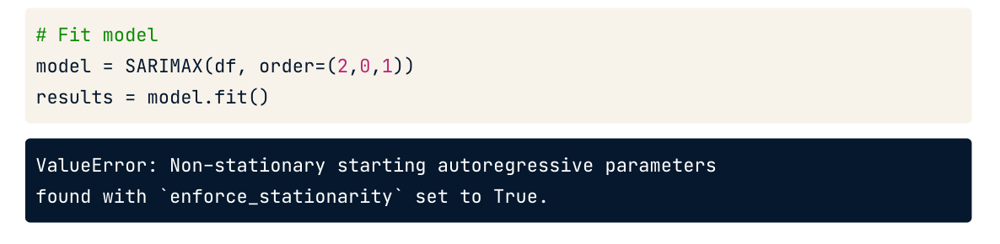

We can skip these orders in our loop by using a try and except block in python. Here's the code we had before.

First we try to run the code in the try statement. We try to fit the model and print the scores. If this fails then the code in the except statement is run, where we print None for the scores

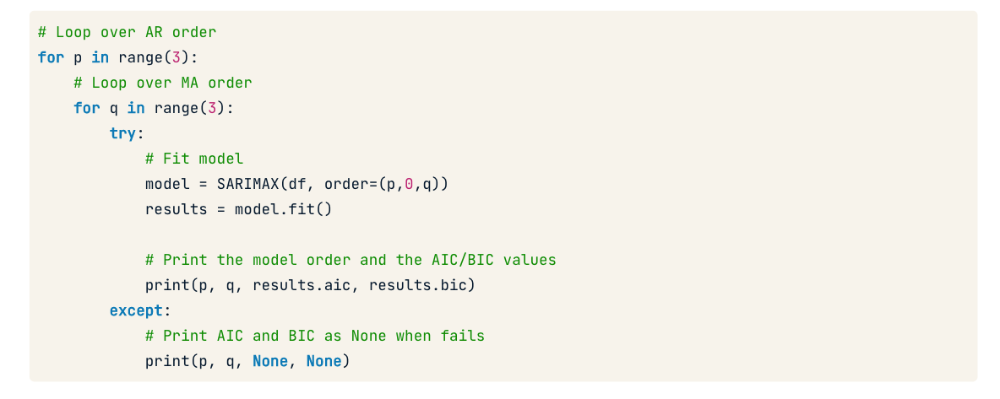


# 3. Model diagnostics

Our work isn't finished once we have built the model. The next step is using common model diagnostics to confirm our model is behaving well.

After we have picked a final model or a final few models we should ask how good they are. This is a key part of the model building life cycle.

**Residuals** To diagnose our model we focus on the residuals to the training data. The residuals are the difference between the our model's one-step-ahead predictions and the real values of the time series.
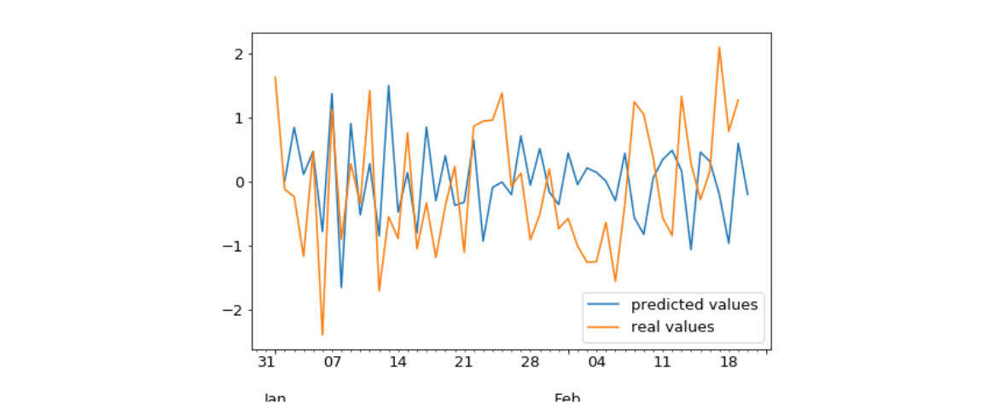

In statsmodels the residuals over the training period can be accessed using the d.resid attribute of the results object. These are stored as a pandas series.
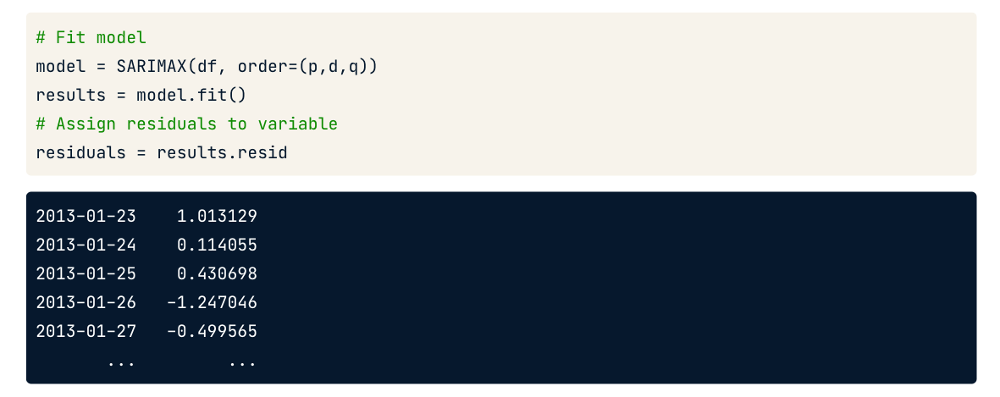

**Mean absolute error** We might like to know, on average, how large the residuals are and so how far our predictions are from the true values. To answer this we can calculate the mean absolute error of the residuals. We can do this in Python using the numpy.abs and the numpy.mean functions.
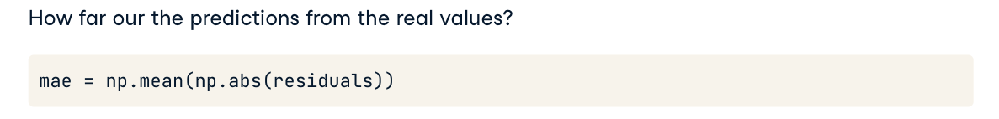

**Plot diagnostics** For an ideal model the residuals should be uncorrelated white Gaussian noise centered on zero. The rest of our diagnostics will help us to see if this is true. 

**results.plot_diagnostics** We can use the results object's dot-plot_diagnostics method to generate four common plots for evaluating this. These are shown on the right.
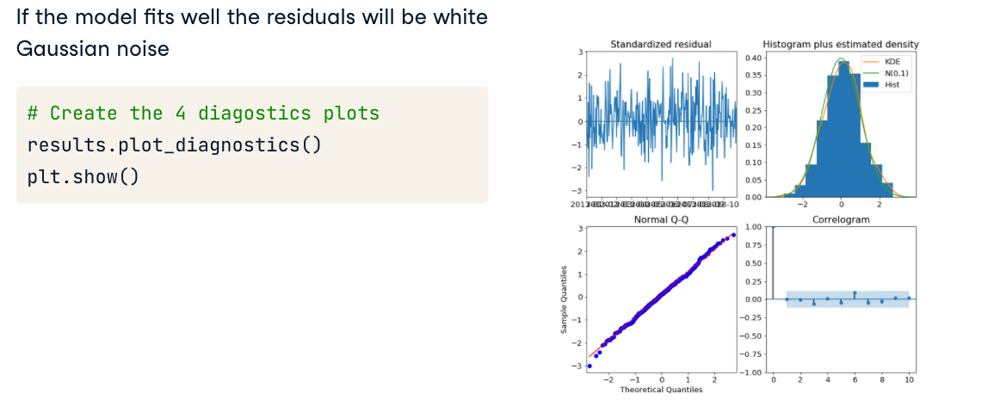

**standardized residuals** One of the four plots shows the one-step-ahead standardized residuals. If our model is working correctly, there should be no obvious structure in the residuals.
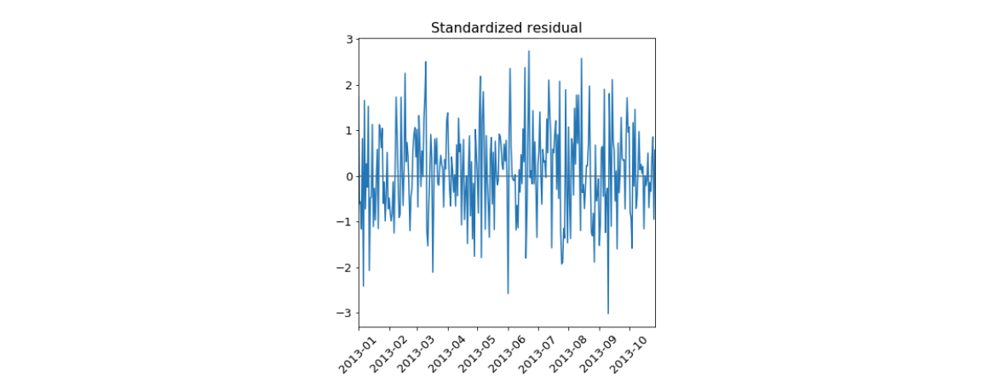

Here the plot on the left has no obvious pattern, but the plot on the right does.
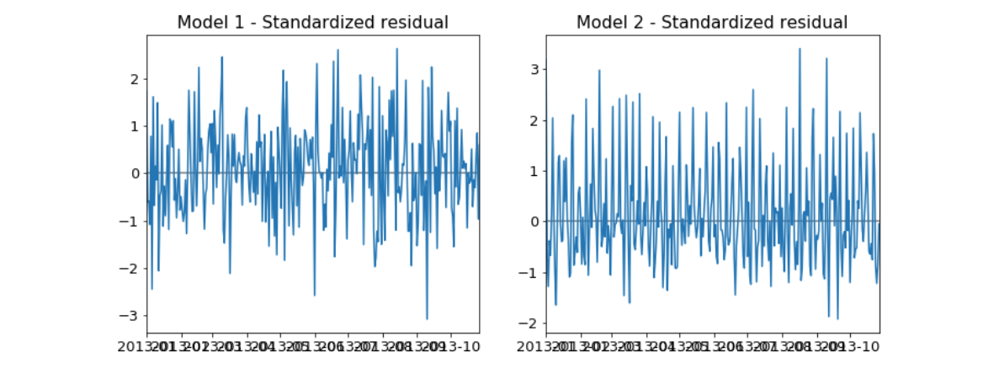

**Histogram plus estimated density** Another of the four plots, shows us the distribution of the residuals. The histogram shows us the measured distribution; the orange line shows a smoothed version of this histogram; and the green line, shows a normal distribution. If our model is good these two lines should be almost the same. Here, the plot on the left looks fine, but the plot on the right doesn't.
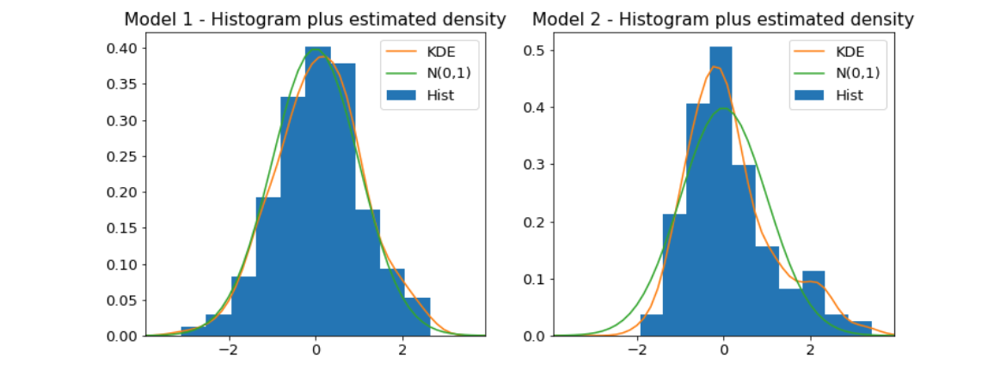

**Normal Q-Q** Another way to show how the distribution of the model residuals compares to a normal distribution is the normal Q-Q. If our residuals are normally distributed then all the points should lie along the red line, except perhaps some values at either end.
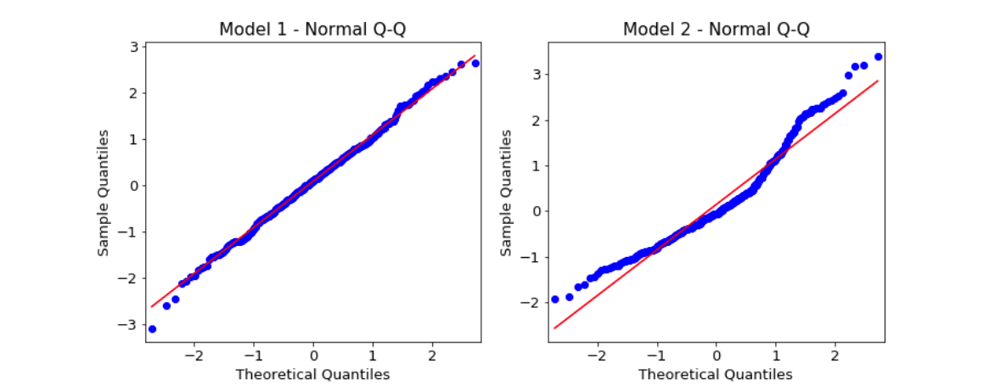

**Correlogram** The last plot is the correlogram, which is just an ACF plot of the residuals rather than the data. 95% of the correlations for lag greater than zero should not be significant. If there is significant correlation in the residuals, it means that there is information in the data that our model hasn't captured.
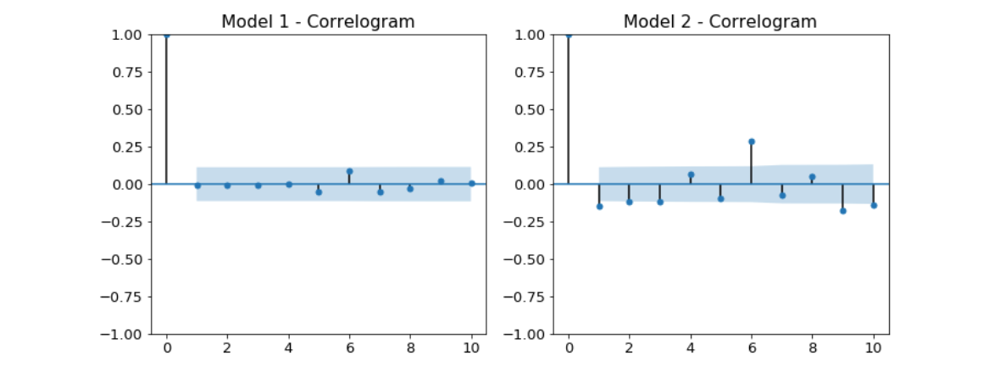

**Summary statistics | results.summary()**


Some of these plots also have accompanying test statistics in results .summary tables. Prob(Q) is the p-value associated with the null hypothesis that the residuals have no correlation structure. Prob(JB) is the p-value associated with the null hypothesis that the residuals are Guassian normally distributed. If either p-value is less than 0.05 we reject that hypothesis.
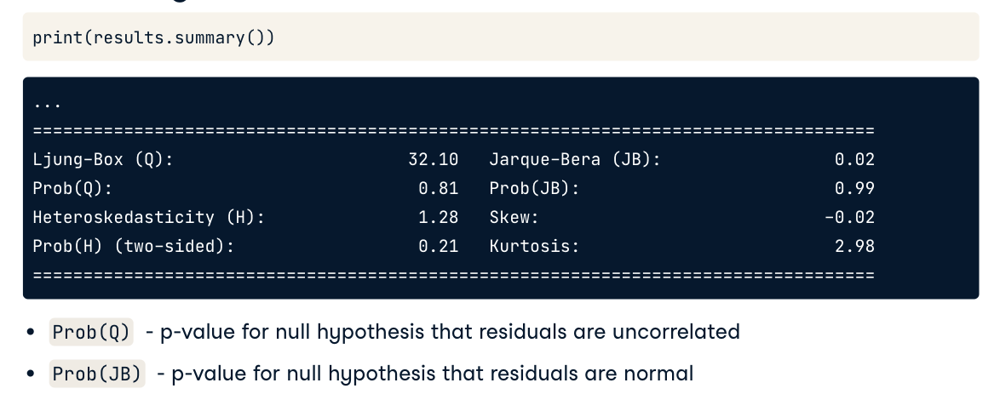

# 4. Box-Jenkins method

**Best practices framework for using these tools.**

Building time series models can represent a lot of work for the modeler and so we want to maximize our ability to carry out these projects fast, efficiently and rigorously. This is where the Box-Jenkins method comes in. The Box-Jenkins method is a kind of checklist for you to go from raw data to a model ready for production. The three main steps that stand between you and a production-ready model are identification, estimation and model diagnostics.
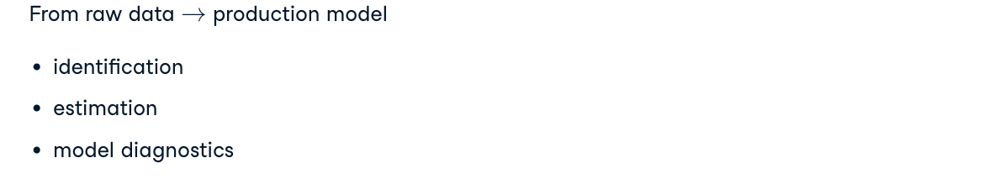

**Identification**

In the identification step we explore and characterize the data to find some form of it which is appropriate to ARIMA modeling. We need to know whether the time series is stationary and find which transformations, such as differencing or taking the log of the data, will make it stationary. Once we have found a stationary form, we must identify which orders p and q are the most promising.
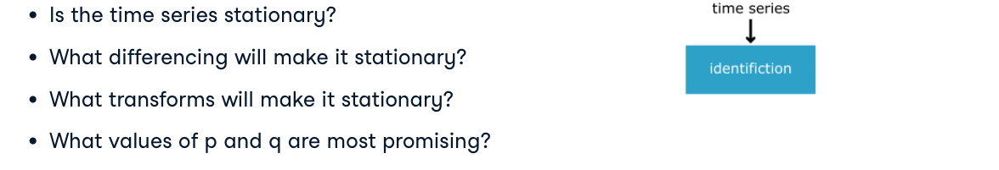

**Identification tools** Our tools to test for stationarity include plotting the time series and using the augmented Dicky-Fuller test. Then we can take the difference or apply transformations until we find the simplest set of transformations that make the time series stationary. Finally we use the ACF and PACF to identify promising model orders.
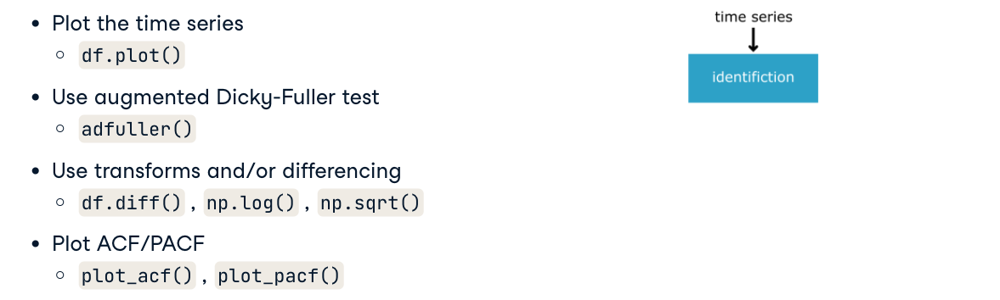

**Estimation**

The next step is estimation, which involves using numerical methods to estimate the AR and MA coefficients of the data. Thankfully, this is automatically done for us when we call the model's .fit method. At this stage we might fit many models and use the AIC and BIC to narrow down to more promising candidates.
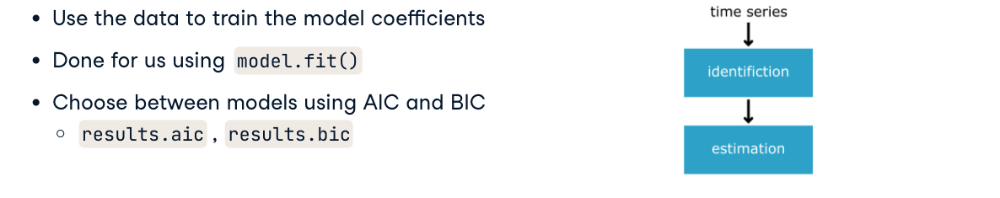

**Model diagnostics**

In the model diagnostics step, we evaluate the quality of the best fitting model. Here is where we use our test statistics and diagnostic plots to make sure the residuals are well behaved.
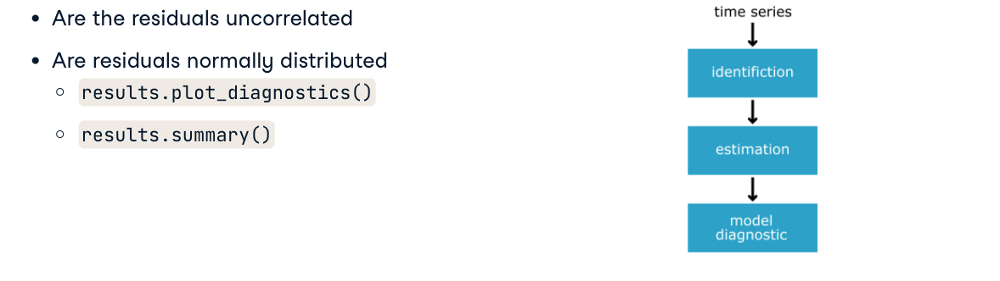

**Decision** Using the information gathered from statistical tests and plots during the diagnostic step, we need to make a decision. Is the model good enough or do we need to go back and rework it.
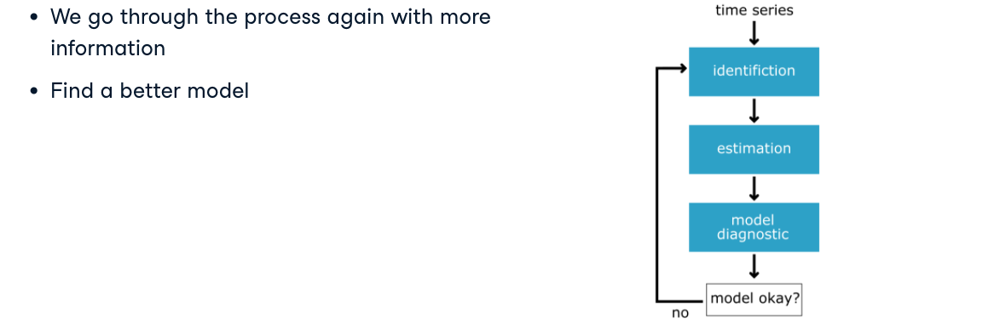

**Repeat** If the residuals aren't as they should be we will go back and rethink our choices in the earlier steps.

**Production** If the residuals are okay then we can go ahead and make forecasts!
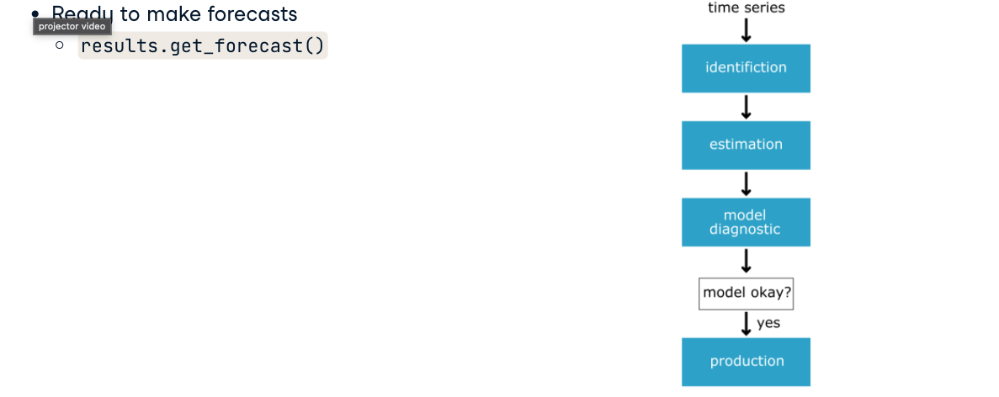

**Box-Jenkins**

This should be your general project workflow when developing time series models. You may have to repeat the process a few times in order to build a model that fits well. But as they say, no pain, no gain.
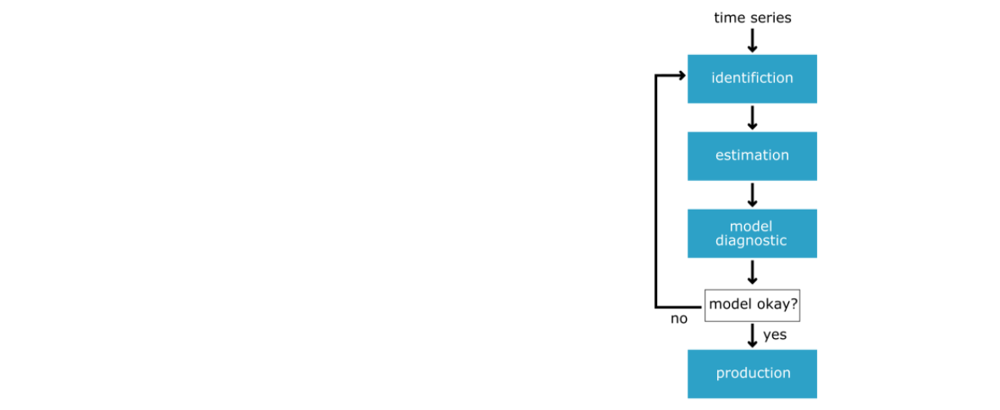

# IV. SEASONAL ARIMA MODELS
**In this final section, we will cover seasonal ARIMA models to fit more complex data. You'll learn how to decompose this data into seasonal and non-seasonal parts.**

# 1. Seasonal time series

A seasonal time series has predictable patterns that repeat regularly. Although we call this feature seasonality, it can repeat after any length of time. These seasonal cycles might repeat every year like sales of suncream, or every week like number of visitors to a park, or every day like number of users on a website at any hour.
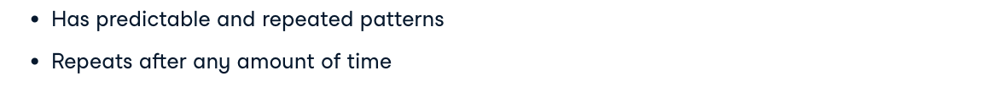

**Seasonal decomposition** This is monthly US candy production, which has a regular cycle that repeats every year. We can think of this, or any time series, as being made of 3 parts. The trend (upper right), the seasonal component(lower left), and the residual (lower right).
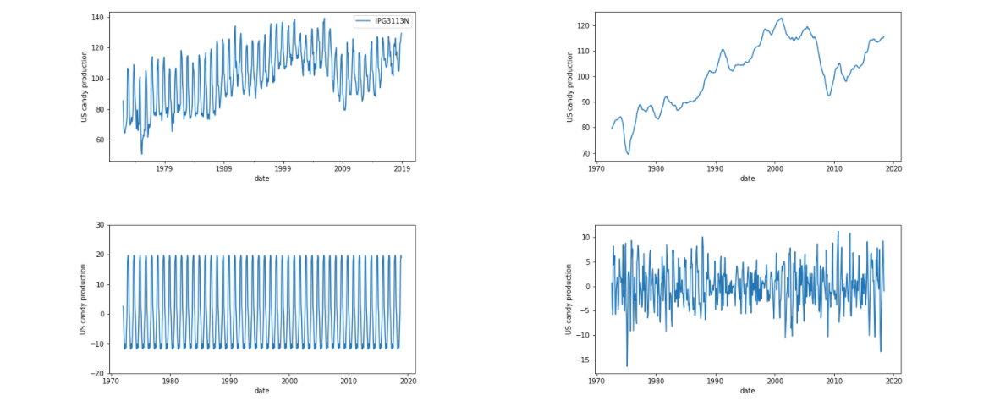

The full time series is these three parts added together.

**Seasonal decomposition using statsmodels** We can use the statsmodels seasonal_decompose function to separate out any time series into these three components. We first import the function from statsmodels.tsa.seasonal We use the function by passing in the series. We also need to set the **period parameter**, which is the number of data points in each repeated cycle. Here our cycle repeats every 12 steps. This function returns a decompose-results object.
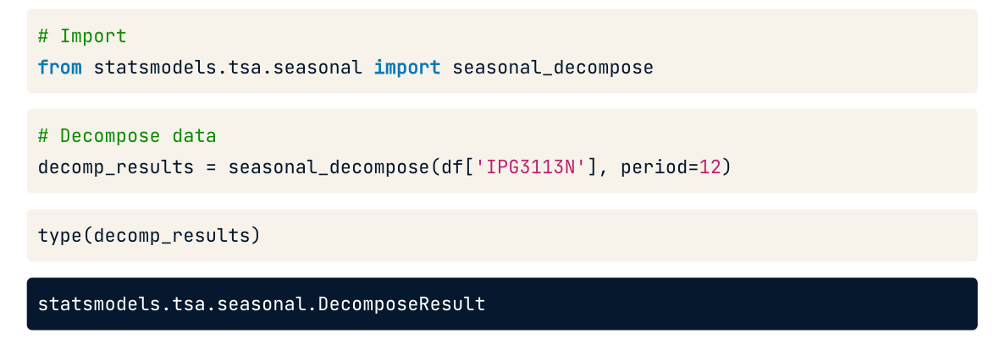

We can use the plot method of this object to plot the components.
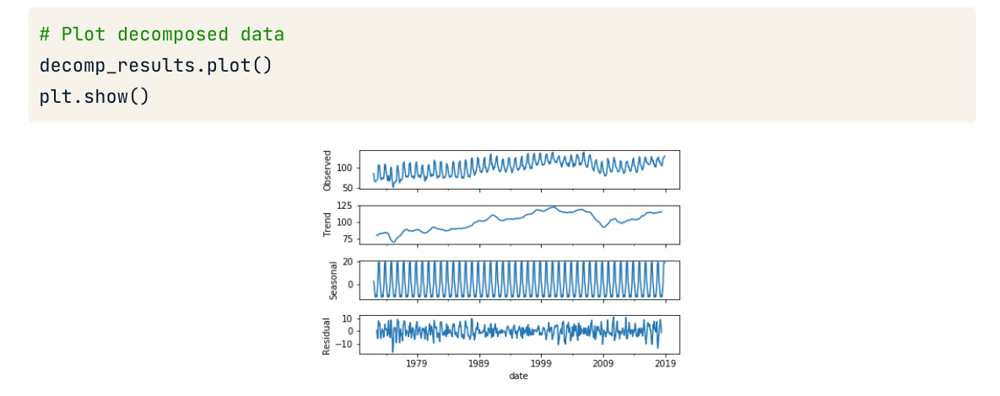

**Finding seasonal period using ACF** In order to decompose the data, we need to know how often the cycles repeat. Often you'll be able to guess this, but we can also use the ACF to identify the period. This is the ACF plot for the candy production time series. The ACF shows a periodic correlation pattern. To find the period we look for a lag greater than one, which is a peak in the ACF plot. Here, there is a peak at 12 lags and so this means that the seasonal component repeats every 12 time steps.
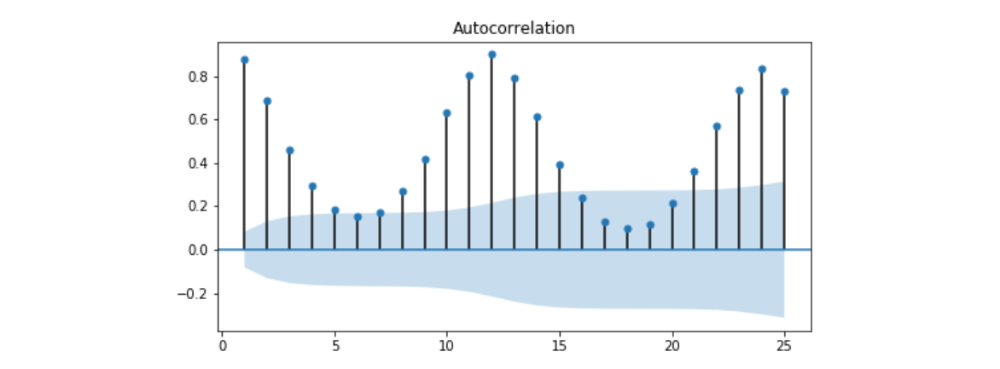

Sometimes it can be hard to tell by eye whether a time series is seasonal or not. This is where the ACF is particularly useful. This is the monthly number of vehicles registered in the US. We could take this time series and plot the ACF directly, but since the time series is non-stationary, the ACF plot will be clearer if we detrend it first.
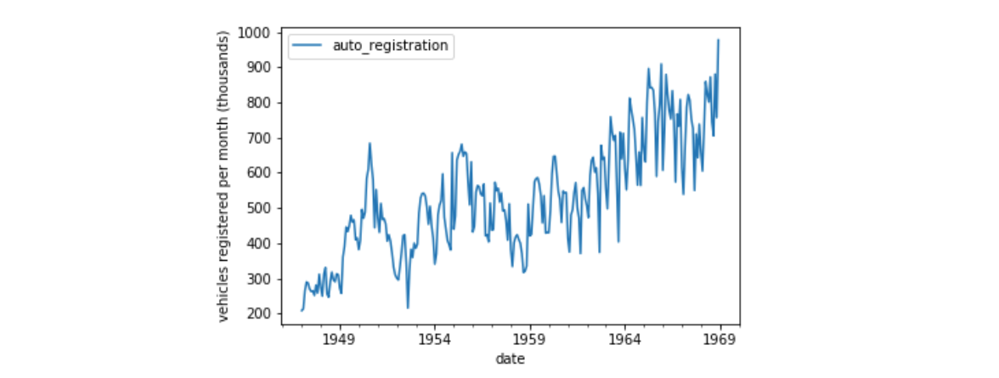

**Detrending time series** We have detrended time series before by taking the difference. However, this time we are only trying to find the period of the time series, and the ACF plot will be clearer if we just **subtract the rolling mean**. We calculate the rolling mean using the DataFrame's dot-rolling method where we pass the window size and also use the dot-mean method. Any large window size, N, will work for this. We subtract this from the original time series and drop the NA values. The time series is now stationary and it will be easier to interpret the ACF plot.
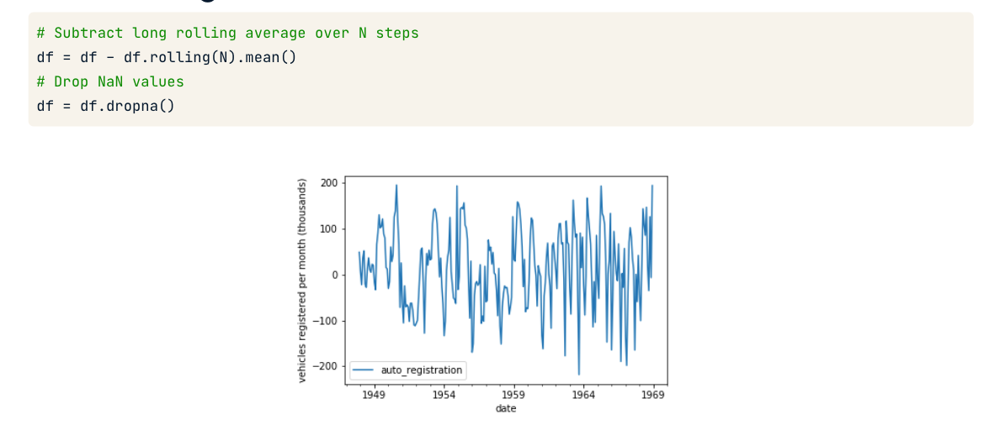

We plot the ACF of the detrended data and we can clearly see that there is a seasonal period of 12 steps.
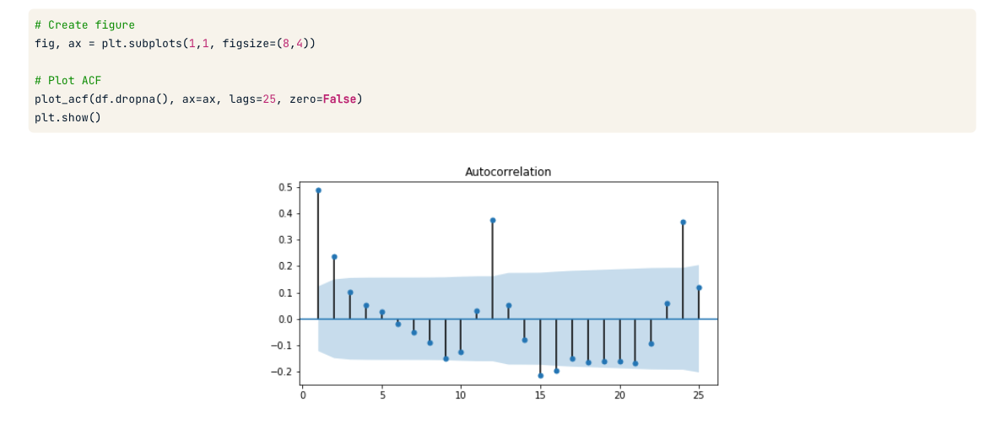

Since the data is seasonal we will always have correlated residuals left if we try to fit an ARIMA model to it. This means that we aren't using all of the information in the data, and so we aren't making the best predictions possible. We'll come back to this in the next section, but for now...
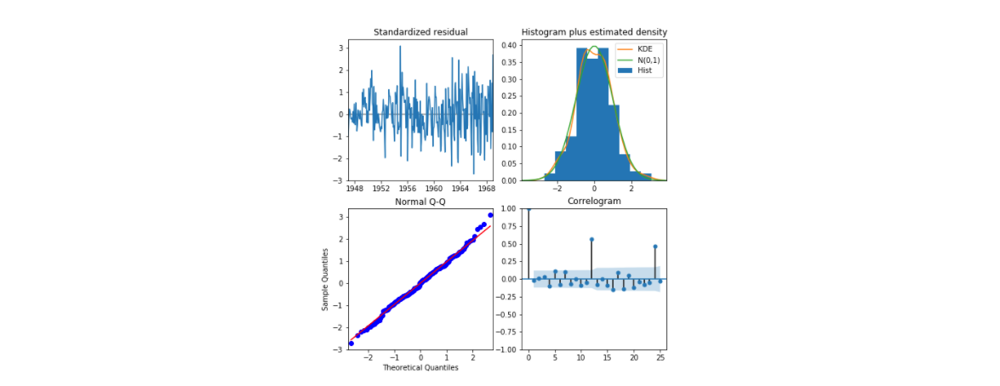


# 2. SARIMA models

Now you know how to find seasonality in data, in this lesson you'll learn how to use that seasonality to make more accurate predictions.

**The SARIMA model**

A SARIMA or seasonal ARIMA model is the tool of choice for seasonal time series. Previously we saw that we could split up our time series into a seasonal and some non-seasonal components. **Fitting a SARIMA model is like fitting two different ARIMA models at once, one to the seasonal part and another to the non-seasonal part.** Since we have these two models we will have two sets of orders. We have non-seasonal orders for the autoregressive, difference and moving average parts. We also have this set of orders for the seasonal part. We use capital P, D and Q for these seasonal orders. There is also a new order, S, which is the length of the seasonal cycle.
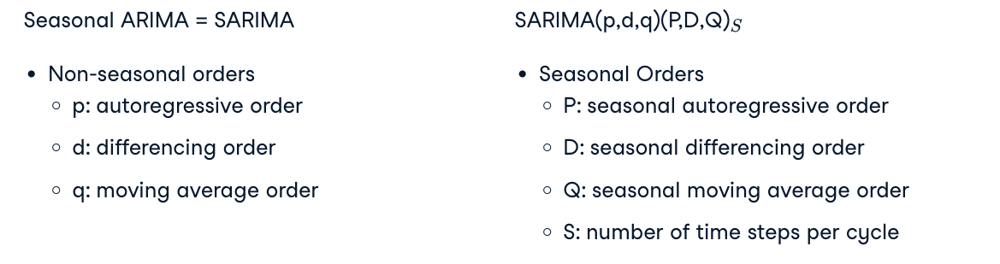

Lets compare the SARIMA and ARIMA model further. This is the equation for a simple ARIMA model. We regress the time series against itself at lags-1 and 2 and against the shock at lag-1. This is the equation for a simple SARIMA model with season length of 7 days. This SARIMA model only has a seasonal part; we have set the non-seasonal orders to zero. We regress the time series against itself at lags of one season and two seasons and against the shock at lag of one season. This particular SARIMA model will be able to capture seasonal, weekly patterns, but won't be able to capture local, day to day patterns. If we construct a SARIMA model and include non-seasonal orders as well, then we can capture both of these patterns.
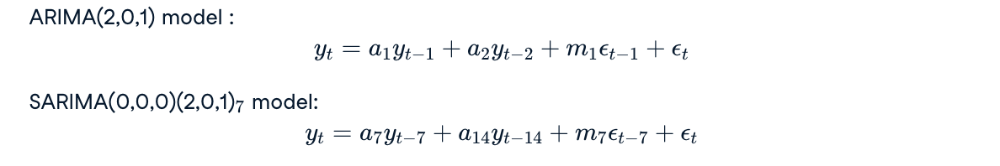

4. Fitting a SARIMA model
Fitting a SARIMA model is almost the same as fitting an ARIMA model. We import the model object and fit it as before. The only difference is that we have to specify the seasonal order as well as the regular order when we instantiate the model. This means that there are a lot of model orders we need to find. In the last lesson you learned how to find the seasonal period, S, using the ACF. The next task is to find the order of differencing.
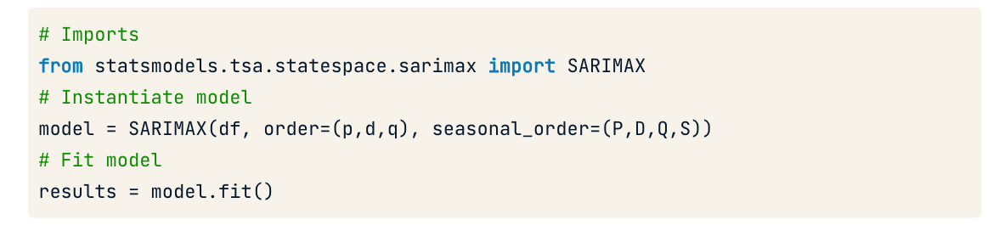

5. Seasonal differencing
To make a time series stationary we may need to apply seasonal differencing. In seasonal differencing, instead of subtracting the most recent time series value, we subtract the time series value from one cycle ago. We can take the seasonal difference by using the DataFrame.diff method. This time we pass in an integer S, the length of the seasonal cycle.
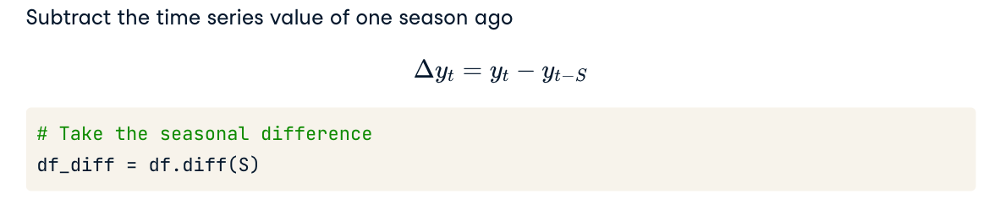

6. Differencing for SARIMA models
If the time series shows a trend then we take the normal difference.
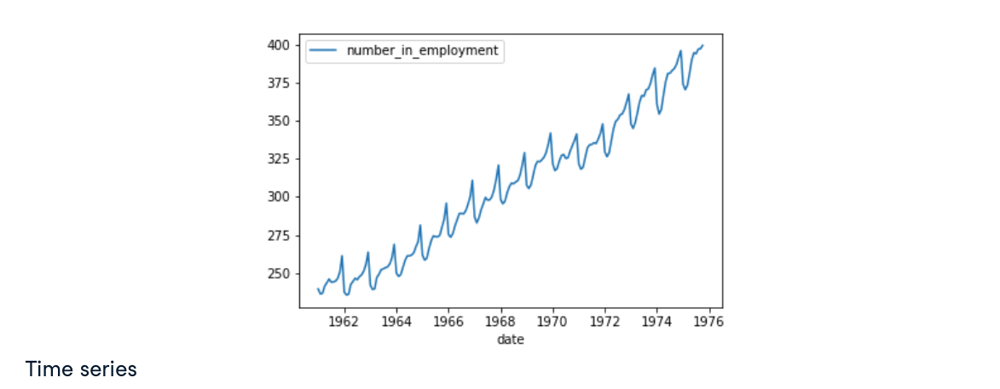

7. Differencing for SARIMA models
If there is a strong seasonal cycle, then we will also take the seasonal difference.
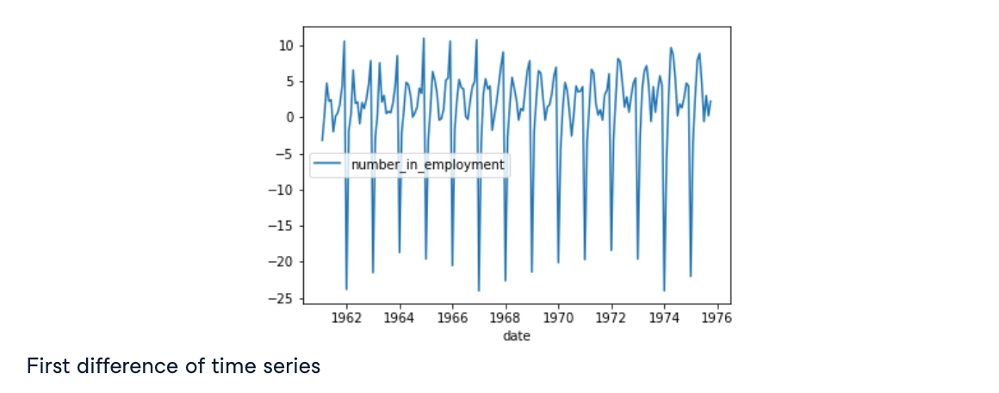

8. Differencing for SARIMA models
Once we have found the two orders of differencing, and made the time series stationary, we need to find the other model orders.
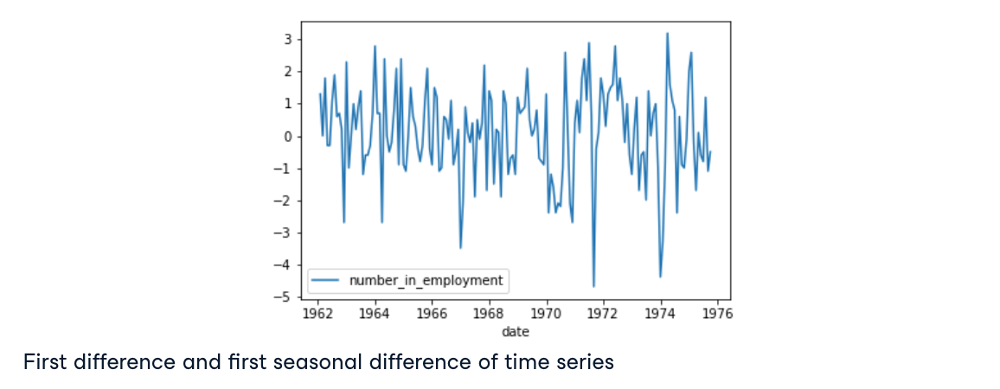

9. Finding p and q
To find the non-seasonal orders, we plot the ACF and the PACF of the differenced time series
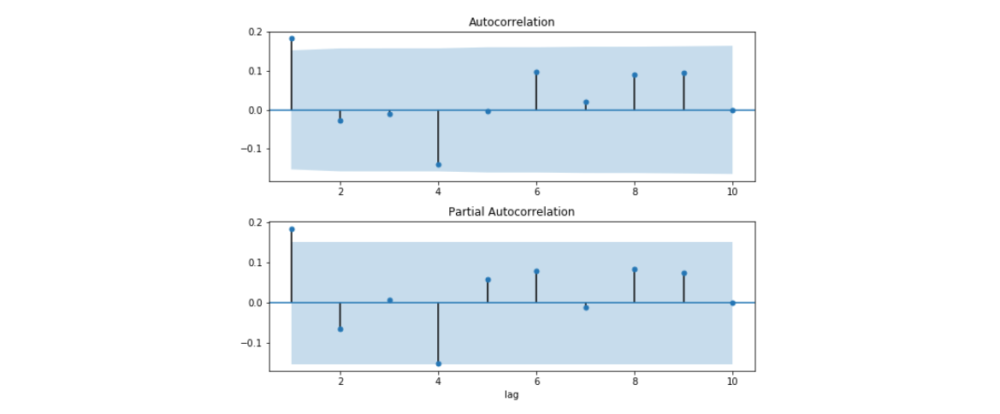

10. Finding P and Q
To find the seasonal orders we plot the ACF and PACF of the differenced time series at multiple seasonal steps. Then we can use the same table of ACF and PACF rules to work out the seasonal order.
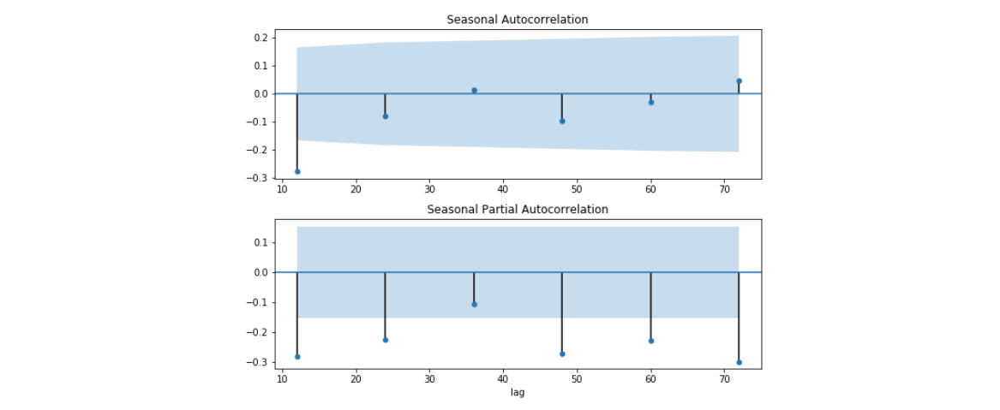

11. Plotting seasonal ACF and PACF
We make these seasonal ACF and PACF plots using the plot-acf and plot-pacf functions, but this time we set the lags parameter to a list of lags instead of a maximum. This plots the ACF and PACF at these specific lags only.
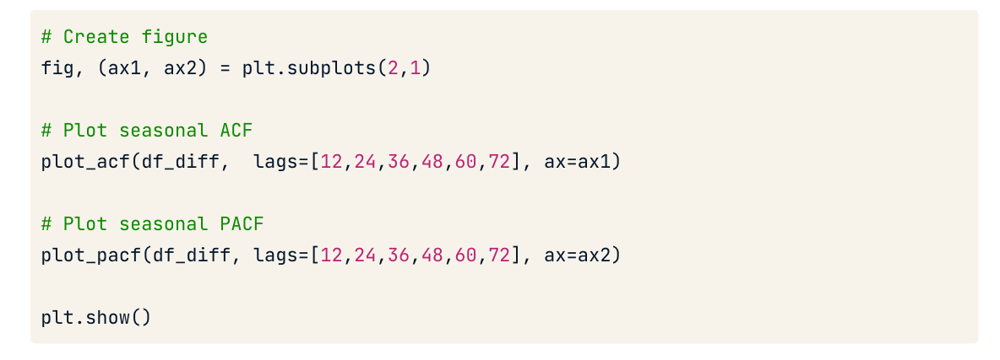

# 3. Automation and saving

Now that you know your way around the SARIMA model you're ready to learn about a powerful tool to search over model orders. By now you are also able to train good models, so it's time to cover how to save those models and update them later.

2. Searching over model orders
Previously we searched over ARIMA model order using for-loops. Now that we have seasonal orders as well, this is very complex. Fortunately there is a package that will do most of this work for us. This is the pmdarima package The auto_arima function from this package loops over model orders to find the best one.
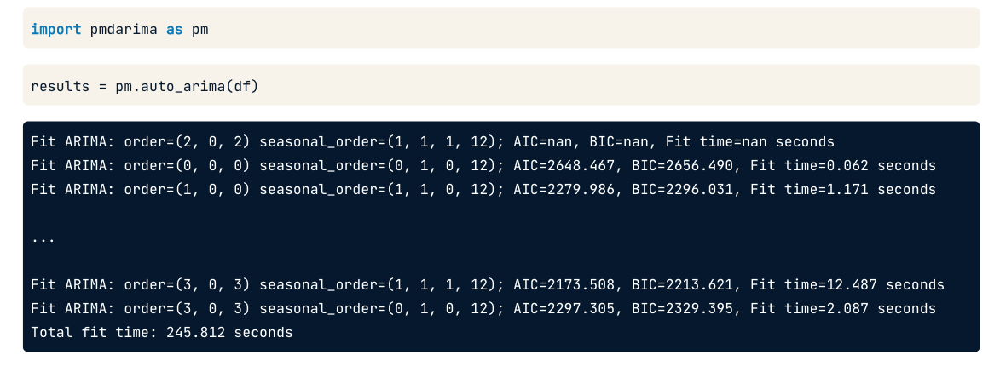

3. pymarima results
The object returned by the function is the results object of the best model found by the search. This object is almost exactly like a statsmodels SARIMAX results object and has the summary and the plot-diagnostics method.
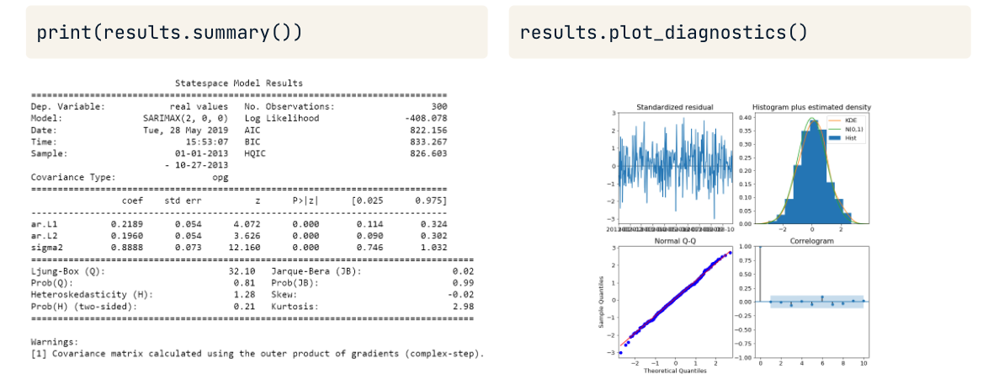

4. Non-seasonal search parameters
The auto-arima function has a lot of parameters that we may want to set. Many of these have default values, but let's cover the important ones.

The only required argument to the function is data. Optionally we can also set the order of non-seasonal differencing; initial estimates of the non-seasonal orders; and the maximum values of non-seasonal orders to test.
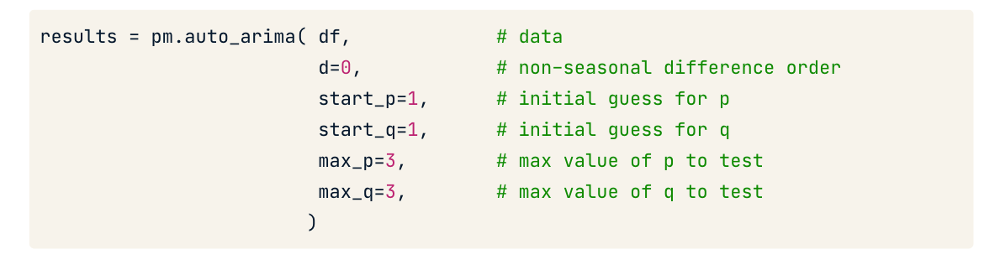

1 https://www.alkaline-ml.com/pmdarima/modules/generated/pmdarima.arima.auto_arima.html


6. Seasonal search parameters
If the time series is seasonal then we set the seasonal parameter to true. We also need to specify the length of the seasonal period; and the order of seasonal differencing. As with the non-seasonal parameters we can specify initial guesses and maximum values for the seasonal orders.
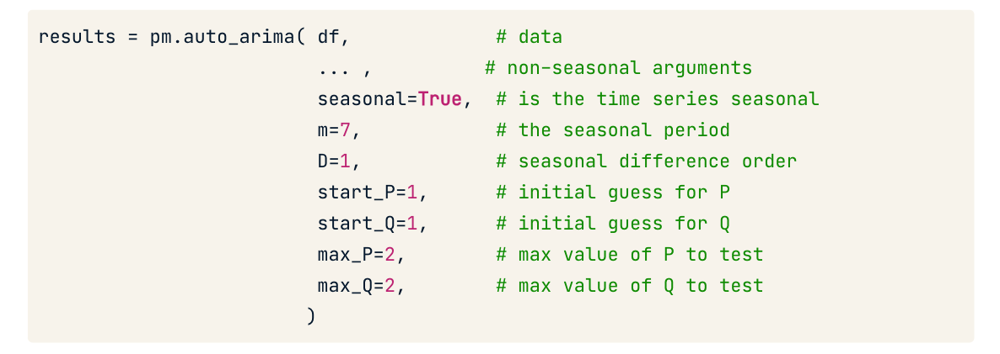

7. Other parameters
Finally, there are a few non-order parameters that we want to set. We select whether to choose the best model based on AIC or BIC. If trace is set to true then this function prints the AIC and BIC for each model it fits. To ignore bad models, as in the try-except block that you wrote, you can set the error action to ignore. If the last parameter, stepwise, is set to true then instead of searching over all model orders the function searches outwards from the initial model order guess using an intelligent search method.
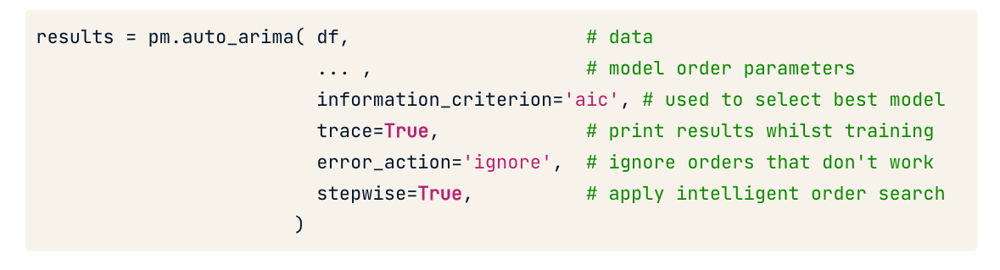

8. Saving model objects
Once you have fit a model in this way, you may want to save it and load it later. You can so this using the joblib package. To save the model we use the dump function from the joblib package. We pass the model results object and the filepath into this function.
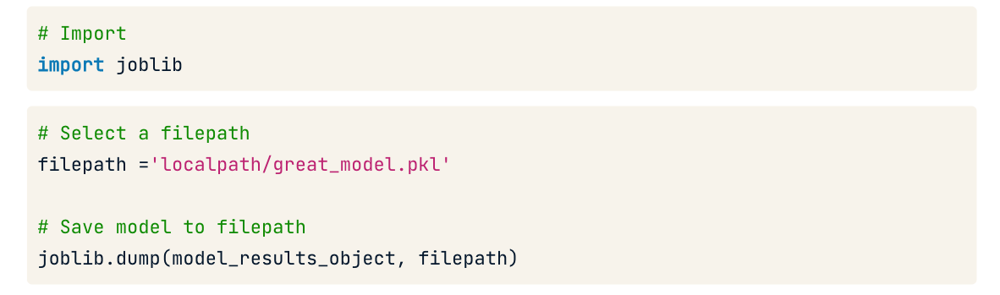

9. Saving model objects
Later on, when we want to make new predictions we can load this model again. To do this we use the load function from joblib
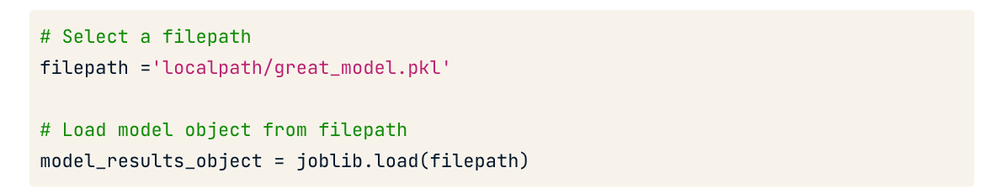

10. Updating model
Some time may have passed since we trained the saved model, and we may want to incorporate data that we have collected since then. We can do this using the pmdarima model's dot-update method. This adds the new observations in df_new and updates the model parameters. This isn't the same as choosing the model order again and so if you are updating with a large amount of new data it may be best to go back to the start of the Box-Jenkins method.
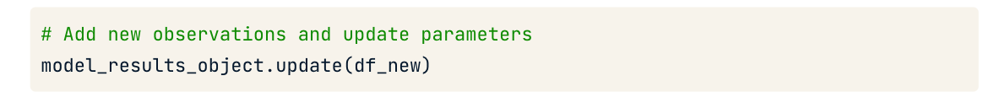

11. Update comparison
Updating time series models with new data is really important since they use the most recent available data for future predictions. Here are two dynamic forecasts of US candy production. The top forecast was made with data up to mid 2007, the bottom forecast was made after updating with data up to mid 2009. You can see that the updated model performs much better at future predictions.
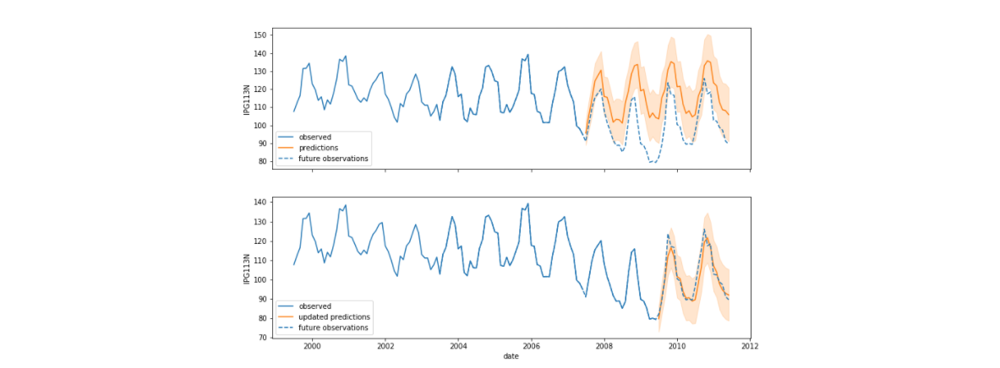

# 4. SARIMA and Box-Jenkins

You've come very far, but there are a few last tricks that will help you when you are dealing with seasonal forecasts.

2. Box-Jenkins
We previously covered the Box-Jenkins method for ARIMA models. We go through identification of the model order; estimating or fitting the model; diagnosing the model residuals; and finally production. For SARIMA models the only step in the method which will change is the identification step.

3. Box-Jenkins with seasonal data
At the identification step we add the tasks of determining whether a time series is seasonal, and if so, then finding its seasonal period. We also need to consider transforms to make the seasonal time series stationary, such as seasonal and non-seasonal differencing and other transforms.
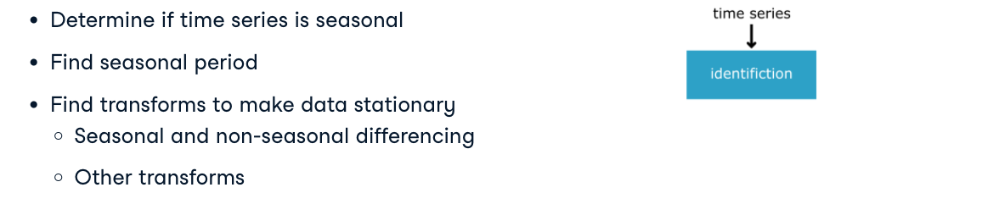

4. Mixed differencing
Sometimes we will have the choice of whether to apply seasonal differencing, non-seasonal differencing or both to make a time series stationary. Some good rules of thumb are that you should never use more than one order of seasonal differencing, and never more than two orders of differencing in total. Sometimes, like in this example, you will be able to make a time series stationary by using either one seasonal difference or one non-seasonal difference. You might build models for each in this case, and see which one makes better predictions.
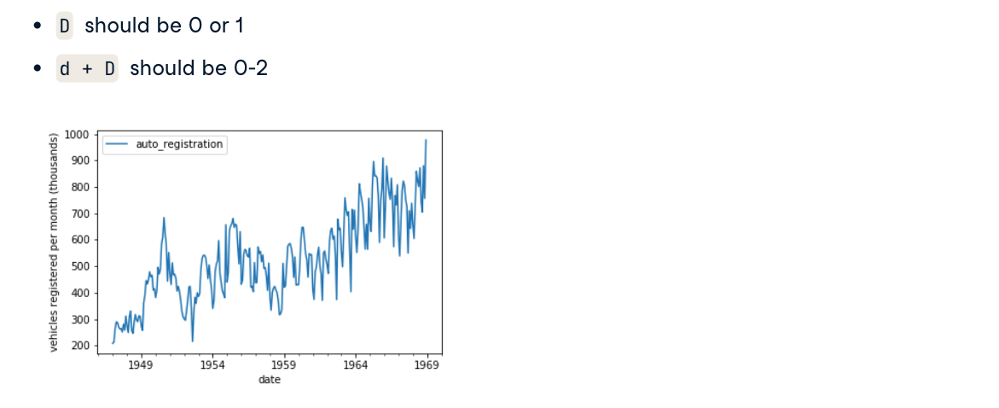

5. Weak vs strong seasonality
This time series only has a weak seasonality, meaning the seasonal oscillations don't always look the same and are harder to identify. When you have a strong seasonal pattern, like the time series on the right, you should always use one order of seasonal differencing. This this will ensure that the seasonal oscillation will remain in your dynamic predictions far into the future without fading out.
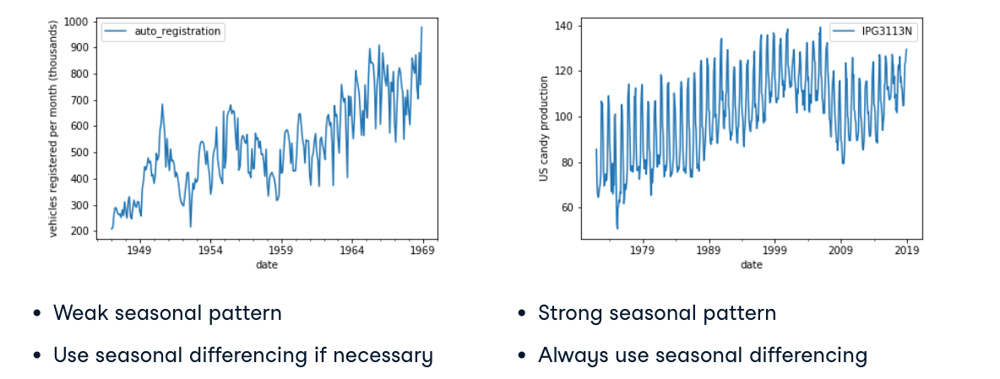

6. Additive vs multiplicative seasonality
Just like in ARIMA modeling sometimes we need to use other transformations on our time series before fitting. Whenever the seasonality is additive we shouldn't need to apply any transforms except differencing. Additive seasonality is where the seasonal pattern just adds or takes away a little from the trend. When the seasonality is multiplicative, the SARIMA model can't fit this without extra transforms. If the seasonality is multiplicative the amplitude of the seasonal oscillations will get larger as the data trends up or smaller as it trends down. To deal with this we take the log transform of the data before modeling it.
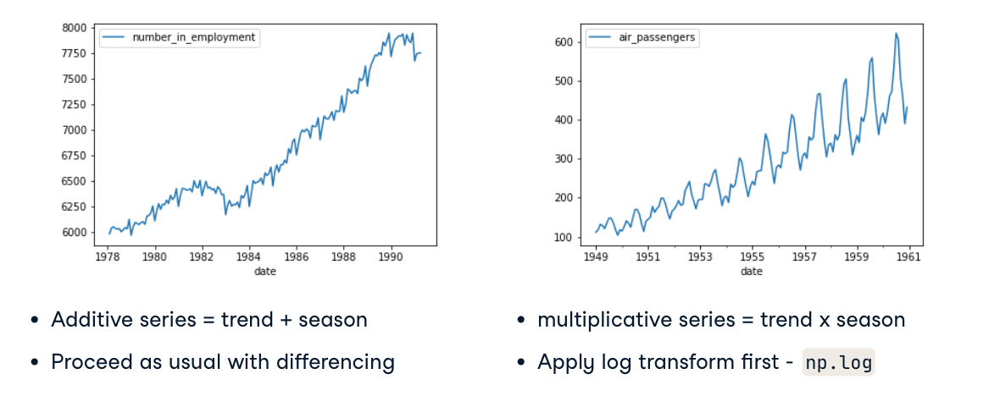

7. Multiplicative to additive seasonality
This is the same time series before and after transform. In the figure on the right we have taken the log of the data and so we have transformed the seasonality to make it additive. We can now model this using a normal SARIMA model with seasonal differencing.
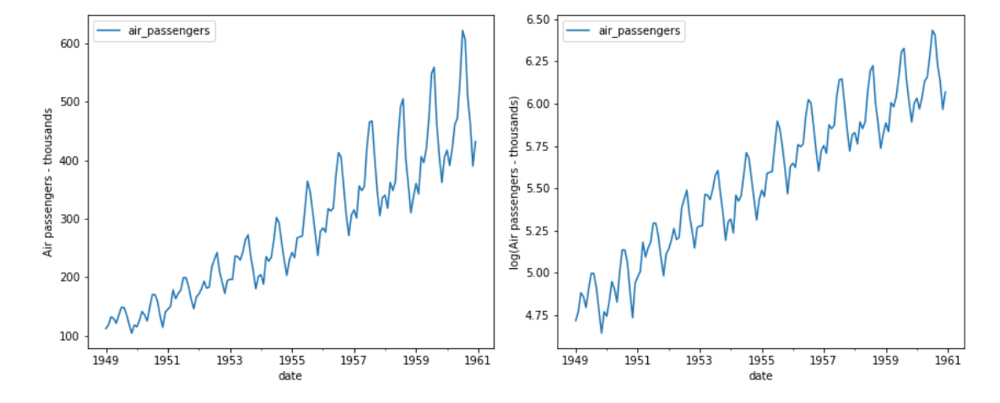

# V. Summary TLDR